# Privacy Policy Knowledge Graph Analysis
### RQ1 & RQ2 — Cross-Sector and Within-Sector Compliance Analysis
### Regulatory Framework: GDPR · CCPA · HIPAA

> **RQ1:** What privacy policy connections exist *across* IT, Healthcare, and Financial Services? Which data types and actors are shared, which are sector-specific, and how does regulatory compliance exposure compare?

>
> **RQ2:** What are Privacy Policy related connections *within* Information Technology, Healthcare, and Financial Services?

---

### Dataset
- **184 S&P-500 companies** — Healthcare (56) · IT (66) · Financial (62)
- **Source:** Company privacy policies parsed into GraphML knowledge graphs
- **Regulations:** GDPR (EU) · CCPA/CPRA (California) · HIPAA (US Health)

### Notebook Structure

| Part | Section | Purpose |
|------|---------|---------|
| 1 | Setup | Install libraries, mount Drive, unzip data |
| 2 | Constants | 184-company sector map, GDPR/CCPA/HIPAA vocabularies |
| 3 | Data Loading & EDA | Parse GraphML files, per-company statistics |
| 4 | Preprocessing | Extract quadruples, detect compliance violations |
| 5 | Knowledge Graph | Build unified 6-edge-type KG across all 184 companies |
| 6 | RQ2 — Within-Sector | Node-type counts, top data points per sector |
| 6b | RQ2 — Sector KGs | Aggregated visual knowledge graph per sector + 4-panel deep dive |
| 7 | RQ1 — Cross-Sector | Shared data types, compliance exposure, violations |
| 8 | Graph Algorithms | BFS · DFS · Shortest Path · All Paths |
| 9 | Centrality | PageRank · Betweenness · In-Degree — 4 bar charts |
| 10 | Visualizations | Cross-sector network · Compliance dashboard · Node-focus ego-graph |
| 11 | Demo KG | Single-company graph walkthrough (Microsoft) |
| 12 | Company Explorer | Explore any of the 184 companies by index |
| 13 | `main()` | Full end-to-end pipeline runner |

---

## Part 1 — Setup
Install required libraries, mount Google Drive, and extract the dataset.
This cell only needs to run once per Colab session.

In [178]:
!pip install networkx matplotlib pandas -q
print("Libraries ready.")

Libraries ready.


In [179]:
# Uncomment to mount Google Drive:
# from google.colab import drive
# drive.mount('/content/drive')

import zipfile, os

ZIP_PATH    = "/content/UniquePPs.zip"
GRAPHML_DIR = "/content/UniquePPs"

if not os.path.exists(GRAPHML_DIR):
    with zipfile.ZipFile(ZIP_PATH, "r") as z:
        z.extractall("/content/")
    print("Unzipped successfully.")
else:
    print("Data already extracted.")

_xml = [f for f in os.listdir(GRAPHML_DIR) if f.endswith(".xml") or f.endswith(".graphml")]
print(f"GraphML files found: {len(_xml)}")

Data already extracted.
GraphML files found: 184


---
## Part 2 — Constants & Sector Mapping

### Sector Map — 184 S&P-500 Companies
| Sector | Count | Industry types |
|--------|-------|---------------|
| Healthcare | 56 | Pharma, medical devices, diagnostics, health insurance |
| IT | 66 | Software, semiconductors, cloud, hardware, fintech |
| Financial | 62 | Banking, asset management, insurance, payments |

### Regulation Vocabularies — Sourced from Official Regulatory Text

| Vocabulary | Source |
|-----------|--------|
| `GDPR_TYPES` | GDPR enumerated categories |
| `CCPA_TYPES` | CCPA enumerated categories |
| `HIPAA_TYPES` | The 18 Safe Harbor PHI identifiers |
| `SENSITIVE_TYPES` | Union of all three |

**GDPR categories:** names/addresses · IP addresses · cookie IDs · fingerprints · racial/ethnic origin · political opinions · religious beliefs · trade union membership · genetic data · biometric data · health information · sex life/sexual orientation

**CCPA categories:** names/addresses · online activity · location data · professional information · SSN · driver's license · financial details · precise location · racial/ethnic origin · religious beliefs · email · genetic data · biometric identifiers · health data · sexual orientation

**HIPAA 18 Safe Harbor identifiers:** name · address · dates · phone · fax · email · SSN · medical record number · health plan beneficiary number · account number · certificate/license number · vehicle identifiers · device identifiers · web URL · IP address · finger/voice print · photographic image · any other unique characteristic

[GDPR/CCPA: https://usercentrics.com/knowledge-hub/gdpr-vs-ccpa-compliance/](https://usercentrics.com/knowledge-hub/gdpr-vs-ccpa-compliance/)

[HIPAA: https://www.dhcs.ca.gov/dataandstats/data/Pages/ListofHIPAAIdentifiers.aspx](https://www.dhcs.ca.gov/dataandstats/data/Pages/ListofHIPAAIdentifiers.aspx)

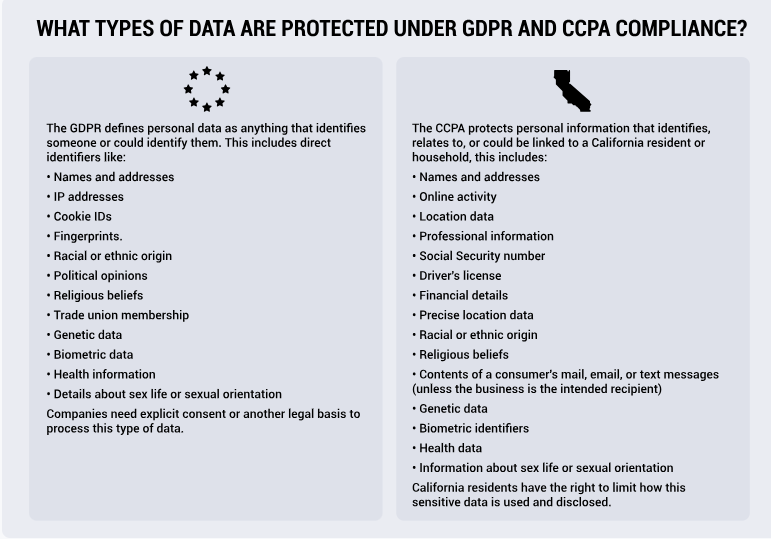

In [180]:
import glob, os, fnmatch
import xml.etree.ElementTree as ET
from collections import defaultdict, Counter, deque

import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.patheffects as pe
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np

NS = {"g": "http://graphml.graphdrawing.org/xmlns"}

SECTORS      = ["Healthcare", "IT", "Financial"]
SECTOR_SIZES = {"Healthcare": 56, "IT": 66, "Financial": 62}
SECTOR_PALETTE = {
    "Healthcare": "#e63946", "IT": "#2a9d8f",
    "Financial":  "#e9c46a", "Unknown": "#aaaaaa",
}

# Per-sector colour schemes used in 4-panel deep-dive charts (Part 6b)
SECTOR_STYLES = {
    "Healthcare": {
        "data_node": "#E74C3C", "actor_node": "#2E86C1",
        "collect_edge": "#1C2833", "subsum_edge": "#27AE60", "title": "#C0392B",
    },
    "Financial": {
        "data_node": "#E67E22", "actor_node": "#8E44AD",
        "collect_edge": "#16A085", "subsum_edge": "#C0392B", "title": "#784212",
    },
    "IT": {
        "data_node": "#F1C40F", "actor_node": "#6C3483",
        "collect_edge": "#148F77", "subsum_edge": "#E74C3C", "title": "#1E8449",
    },
}
SECTOR_SIZES_MAP = {"Healthcare": 56, "Financial": 62, "IT": 66}

SECTOR_MAP = {
    "AbbVie":"Healthcare","Abbott_Laboratories":"Healthcare",
    "Agilent_Technologies":"Healthcare","Align_Technology":"Healthcare",
    "Amgen":"Healthcare","Baxter_International":"Healthcare",
    "Becton_Dickinson":"Healthcare","Bio-Techne":"Healthcare",
    "Biogen":"Healthcare","Boston_Scientific":"Healthcare",
    "Bristol_Myers_Squibb":"Healthcare","CVS_Health":"Healthcare",
    "Cardinal_Health":"Healthcare","Cencora":"Healthcare",
    "Centene_Corporation":"Healthcare","Charles_River_Laboratories":"Healthcare",
    "Cigna":"Healthcare","Cooper_Companies_(The)":"Healthcare",
    "DaVita":"Healthcare","Danaher_Corporation":"Healthcare",
    "Dexcom":"Healthcare","Edwards_Lifesciences":"Healthcare",
    "Elevance_Health":"Healthcare","GE_HealthCare":"Healthcare",
    "Gilead_Sciences":"Healthcare","HCA_Healthcare":"Healthcare",
    "Hologic":"Healthcare","Humana":"Healthcare","IQVIA":"Healthcare",
    "Idexx_Laboratories":"Healthcare","Incyte":"Healthcare",
    "Insulet_Corporation":"Healthcare","Intuitive_Surgical":"Healthcare",
    "Johnson_&_Johnson":"Healthcare","Labcorp":"Healthcare",
    "Lilly_(Eli)":"Healthcare","McKesson_Corporation":"Healthcare",
    "Merck_&_Co.":"Healthcare","Moderna":"Healthcare",
    "Molina_Healthcare":"Healthcare","Pfizer":"Healthcare",
    "Quest_Diagnostics":"Healthcare","Regeneron_Pharmaceuticals":"Healthcare",
    "ResMed":"Healthcare","Revvity":"Healthcare","Solventum":"Healthcare",
    "Steris":"Healthcare","Stryker_Corporation":"Healthcare",
    "Thermo_Fisher_Scientific":"Healthcare","UnitedHealth_Group":"Healthcare",
    "Universal_Health_Services":"Healthcare","Viatris":"Healthcare",
    "Waters_Corporation":"Healthcare","West_Pharmaceutical_Services":"Healthcare",
    "Zimmer_Biomet":"Healthcare","Zoetis":"Healthcare",
    "Aflac":"Financial","Aflac_old":"Financial","Allstate":"Financial",
    "American_Express":"Financial","American_International_Group":"Financial",
    "Aon_plc":"Financial","Apollo_Global_Management":"Financial",
    "Arthur_J._Gallagher_&_Co.":"Financial","Assurant":"Financial",
    "BNY_Mellon":"Financial","Bank_of_America":"Financial",
    "Berkshire_Hathaway":"Financial","BlackRock":"Financial",
    "Blackstone_Inc.":"Financial","Brown_&_Brown":"Financial",
    "CME_Group":"Financial","Capital_One":"Financial",
    "Cboe_Global_Markets":"Financial","Charles_Schwab_Corporation":"Financial",
    "Chubb_Limited":"Financial","Cincinnati_Financial":"Financial",
    "Citigroup":"Financial","Citizens_Financial_Group":"Financial",
    "Coinbase":"Financial","Corpay":"Financial","Everest_Group":"Financial",
    "FactSet":"Financial","Fair_Isaac":"Financial",
    "Fidelity_National_Information_Services":"Financial","Fiserv":"Financial",
    "Franklin_Resources":"Financial","Globe_Life":"Financial",
    "Goldman_Sachs":"Financial","Hartford_(The)":"Financial",
    "Huntington_Bancshares":"Financial","Intercontinental_Exchange":"Financial",
    "Invesco":"Financial","JPMorgan_Chase":"Financial",
    "KKR_&_Co.":"Financial","KeyCorp":"Financial",
    "Loews_Corporation":"Financial","MSCI_Inc.":"Financial",
    "MarketAxess":"Financial","Marsh_McLennan":"Financial",
    "Mastercard":"Financial","MetLife":"Financial",
    "Moody_s_Corporation":"Financial","Morgan_Stanley":"Financial",
    "Nasdaq,_Inc.":"Financial","PayPal":"Financial",
    "Progressive_Corporation":"Financial","Prudential_Financial":"Financial",
    "Regions_Financial_Corporation":"Financial","S&P_Global":"Financial",
    "State_Street_Corporation":"Financial","Synchrony_Financial":"Financial",
    "T._Rowe_Price":"Financial","Travelers_Companies_(The)":"Financial",
    "Visa_Inc.":"Financial","W._R._Berkley_Corporation":"Financial",
    "Wells_Fargo":"Financial","Willis_Towers_Watson":"Financial",
    "Accenture":"IT","Adobe_Inc.":"IT","Advanced_Micro_Devices":"IT",
    "Akamai_Technologies":"IT","Amphenol":"IT","Analog_Devices":"IT",
    "Ansys":"IT","Apple_Inc.":"IT","Applied_Materials":"IT",
    "Arista_Networks":"IT","Autodesk":"IT","Broadcom":"IT",
    "CDW_Corporation":"IT","Cadence_Design_Systems":"IT","Cisco":"IT",
    "Cognizant":"IT","Corning_Inc.":"IT","CrowdStrike":"IT",
    "Dell_Technologies":"IT","EPAM_Systems":"IT","Enphase_Energy":"IT",
    "F5,_Inc.":"IT","First_Solar":"IT","Fortinet":"IT","Gartner":"IT",
    "Gen_Digital":"IT","GoDaddy":"IT","Global_Payments":"IT",
    "Hewlett_Packard_Enterprise":"IT","IBM":"IT","Intel":"IT",
    "Intuit":"IT","Jabil":"IT","Jack_Henry_&_Associates":"IT",
    "Juniper_Networks":"IT","KLA_Corporation":"IT",
    "Keysight_Technologies":"IT","Lam_Research":"IT",
    "Microchip_Technology":"IT","Micron_Technology":"IT",
    "Microsoft":"IT","Monolithic_Power_Systems":"IT",
    "Motorola_Solutions":"IT","NXP_Semiconductors":"IT",
    "NetApp":"IT","Nvidia":"IT","ON_Semiconductor":"IT",
    "Oracle_Corporation":"IT","PTC_Inc.":"IT","Palantir_Technologies":"IT",
    "Palo_Alto_Networks":"IT","Qualcomm":"IT","Roper_Technologies":"IT",
    "Salesforce":"IT","Seagate_Technology":"IT","Skyworks_Solutions":"IT",
    "Supermicro":"IT","Synopsys":"IT","TE_Connectivity":"IT",
    "Teledyne_Technologies":"IT","Teradyne":"IT","Texas_Instruments":"IT",
    "Trimble_Inc.":"IT","Verisign":"IT","Western_Digital":"IT",
    "Zebra_Technologies":"IT",
}

_c = Counter(SECTOR_MAP.values())
print(f"Healthcare : {_c['Healthcare']}  (expected 56)")
print(f"IT         : {_c['IT']}  (expected 66)")
print(f"Financial  : {_c['Financial']}  (expected 62)")
print(f"Total      : {sum(_c.values())}  (expected 184)")
assert sum(_c.values()) == 184, "Total must be 184!"

'''
# ── GDPR — sourced from GDPR infographic ──────────────────────────────────────
GDPR_TYPES = {
    "person name","patient name","postal address",
    "ip address","cookie","cookie / pixel tag","cookies","cookie id",
    "fingerprint","racial origin","race / ethnicity","ethnic origin",
    "political opinion","political views","religious belief","religious beliefs",
    "trade union membership","genetic data","genetic information",
    "biometric information","biometric data","biometric identifier","biometric identifiers",
    "health information","health data","health","sexual orientation","sex life",
}

# ── CCPA — sourced from CCPA infographic ──────────────────────────────────────
CCPA_TYPES = {
    "person name","patient name","postal address",
    "online activity","internet activity","browsing history","search history",
    "geolocation","precise geolocation","location data",
    "professional information","employment history","employment information",
    "ssn","social security number","driver's license","driver's license number",
    "financial information","financial details","race / ethnicity","racial origin",
    "ethnic origin","religious belief","religious beliefs","email address",
    "genetic data","genetic information","biometric information",
    "biometric identifiers","biometric data","biometric identifier",
    "health information","health data","health","sexual orientation","sex life",
}

# ── HIPAA — strictly the 18 Safe Harbor identifiers ──────────────────────────
HIPAA_TYPES = {
    "person name","patient name","postal address","geographic data",
    "date of birth","admission date","discharge date","date of death","age",
    "phone number","telephone number","fax number","email address",
    "ssn","social security number","medical record number",
    "health plan beneficiary number","account number","account information","account name",
    "certificate number","license number","driver's license","driver's license number",
    "vehicle identifier","license plate number","vehicle serial number",
    "device identifier","device information","serial number",
    "web url","url","ip address","fingerprint","voiceprint",
    "photograph","photographic image","unique identifier","personal identifier",
}
'''

# ── GDPR — Articles 4 & 9 + Recitals 26, 30, 51 ──────────────────────────────
GDPR_TYPES = {
    # Identifiers / Article 4(1) personal data
    "person name", "patient name", "full name", "first name", "last name",
    "name", "alias", "pseudonym",
    "postal address", "street address", "address", "home address",
    "ip address", "ip", "online identifier", "cookie", "cookie / pixel tag",
    "cookies", "cookie id", "pixel tag", "tracking pixel", "beacon",
    "device fingerprint", "fingerprint", "browser fingerprint",
    "location data", "geolocation", "location",

    # Article 9 — Special categories (heightened protection)
    "racial origin", "race / ethnicity", "ethnic origin", "ethnicity",
    "national origin", "nationality",
    "political opinion", "political views", "political belief",
    "religious belief", "religious beliefs", "religion", "faith",
    "philosophical belief", "philosophical beliefs",
    "trade union membership", "union membership",
    "genetic data", "genetic information", "dna",
    "biometric information", "biometric data", "biometric identifier",
    "biometric identifiers", "biometric", "fingerprint", "voiceprint",
    "facial recognition", "retina scan",
    "health information", "health data", "health", "medical information",
    "medical data", "medical record", "medical history",
    "mental health", "mental health information",
    "sexual orientation", "sex life", "sexual behavior",

    # Recital 30 — online identifiers
    "device identifier", "device id", "advertising id", "ad id",
    "session id", "user id", "unique identifier",
}


# ── CCPA — Civil Code §1798.140(v)(1)(A–K) + CPRA §1798.121 ──────────────────
CCPA_TYPES = {
    # Category A — Identifiers
    "person name", "patient name", "full name", "first name", "last name",
    "name", "alias", "postal address", "street address", "address",
    "unique personal identifier", "unique identifier", "online identifier",
    "ip address", "email address", "account name",
    "ssn", "social security number",
    "driver's license", "driver's license number", "drivers license",
    "passport number", "passport",

    # Category B — Personal records (Cal. Civ. Code §1798.80(e))
    "signature", "physical characteristics", "physical description",
    "phone number", "telephone number",
    "education information", "employment information", "employment history",
    "bank account", "bank account number", "financial account",
    "financial account number", "credit card number", "debit card number",
    "credit / debit card number", "payment card number",
    "medical information", "health insurance information",

    # Category C — Protected classifications
    "race / ethnicity", "racial origin", "ethnic origin", "ethnicity",
    "national origin", "nationality",
    "religion", "religious belief", "religious beliefs",
    "age", "date of birth",
    "sex", "gender", "sexual orientation", "sex life",
    "disability", "medical condition",
    "veteran status", "military status",
    "marital status",
    "genetic data", "genetic information", "dna",

    # Category D — Commercial information
    "purchase history", "transaction data", "transaction information",
    "purchasing history", "consuming history", "consuming tendency",
    "product interaction",

    # Category E — Biometric
    "biometric information", "biometric data", "biometric identifier",
    "biometric identifiers", "biometric", "fingerprint", "voiceprint",
    "facial recognition", "retina scan", "iris scan",
    "sleep data", "health data", "exercise data",

    # Category F — Internet / network activity
    "internet activity", "online activity", "browsing history",
    "search history", "search query",
    "interaction with website", "interaction with app",
    "interaction with advertisement",

    # Category G — Geolocation
    "geolocation", "precise geolocation", "location data", "location",
    "gps data", "gps coordinate", "latitude", "longitude",

    # Category H — Sensory data
    "audio recording", "voice recording", "audio data",
    "video recording", "visual information", "photograph",
    "thermal data", "olfactory data",

    # Category I — Professional / employment
    "professional information", "employment information", "employment history",
    "professional history", "job title", "employer",

    # Category J — Education
    "education information", "school record", "student record",

    # Category K — Inferences
    "inference", "consumer profile", "profile", "preference",
    "characteristic", "psychological trend", "predisposition",
    "behavior", "attitude", "intelligence", "ability",

    # CPRA §1798.121 — Sensitive personal information (stronger rights)
    "financial information", "financial details",
    "precise geolocation",
    "health information", "health data", "health",
    "union membership", "trade union membership",
}


# ── HIPAA — 45 CFR §164.514(b) Safe Harbor — all 18 identifiers ──────────────
HIPAA_TYPES = {
    # 1. Names
    "person name", "patient name", "full name", "first name", "last name",
    "name", "patient", "individual name",

    # 2. Geographic subdivisions smaller than state
    "postal address", "street address", "address", "zip code", "zipcode",
    "postcode", "city", "county", "borough", "district", "precinct",
    "geocode", "geographic data", "geographic subdivision",

    # 3. Dates (except year) for individuals over 89
    "date of birth", "dob", "birthdate", "birth date",
    "admission date", "discharge date", "date of death",
    "date", "age", "age over 89",

    # 4. Phone numbers
    "phone number", "telephone number", "mobile number",
    "cell phone number", "contact number", "fax number",

    # 5. Fax numbers (separate identifier)
    "fax", "fax number",

    # 6. Email addresses
    "email address", "email", "e-mail address", "e-mail",

    # 7. Social security numbers
    "ssn", "social security number", "social security",

    # 8. Medical record numbers
    "medical record number", "mrn", "medical record",
    "patient id", "patient identifier", "patient number",

    # 9. Health plan beneficiary numbers
    "health plan beneficiary number", "beneficiary number",
    "insurance id", "insurance number", "member id", "member number",
    "health plan number",

    # 10. Account numbers
    "account number", "account information", "account name",
    "bank account", "financial account number",

    # 11. Certificate / license numbers
    "certificate number", "license number",
    "driver's license", "driver's license number", "drivers license",
    "medical license", "professional license", "npi",
    "national provider identifier",

    # 12. Vehicle identifiers and serial numbers
    "vehicle identifier", "vehicle serial number", "vin",
    "license plate number", "license plate", "vehicle registration",

    # 13. Device identifiers and serial numbers
    "device identifier", "device id", "device information",
    "serial number", "imei", "mac address", "uuid",
    "device serial number",

    # 14. Web URLs
    "web url", "url", "website", "web address",

    # 15. IP addresses
    "ip address", "ip",

    # 16. Biometric identifiers (finger and voice prints)
    "fingerprint", "voiceprint", "biometric identifier",
    "biometric identifiers", "biometric information",
    "biometric data", "biometric",

    # 17. Full-face photographs and comparable images
    "photograph", "photographic image", "full face photograph",
    "photo", "image", "facial image",

    # 18. Any other unique identifying number or code
    "unique identifier", "personal identifier", "unique characteristic",
    "unique code", "identifier",
}


# ── Union of all three ────────────────────────────────────────────────────────
SENSITIVE_TYPES = GDPR_TYPES | CCPA_TYPES | HIPAA_TYPES

# ── Quick counts ──────────────────────────────────────────────────────────────
print(f"GDPR  : {len(GDPR_TYPES)} terms")
print(f"CCPA  : {len(CCPA_TYPES)} terms")
print(f"HIPAA : {len(HIPAA_TYPES)} terms")
print(f"Union : {len(SENSITIVE_TYPES)} unique terms")
SENSITIVE_TYPES = GDPR_TYPES | CCPA_TYPES | HIPAA_TYPES
VOCABS = {"GDPR": GDPR_TYPES, "CCPA": CCPA_TYPES, "HIPAA": HIPAA_TYPES}

print(f"\nGDPR  : {len(GDPR_TYPES)} terms")
print(f"CCPA  : {len(CCPA_TYPES)} terms")
print(f"HIPAA : {len(HIPAA_TYPES)} terms")
print(f"Union : {len(SENSITIVE_TYPES)} unique terms in SENSITIVE_TYPES")
print("Constants loaded.")

Healthcare : 56  (expected 56)
IT         : 66  (expected 66)
Financial  : 62  (expected 62)
Total      : 184  (expected 184)
GDPR  : 75 terms
CCPA  : 131 terms
HIPAA : 111 terms
Union : 236 unique terms

GDPR  : 75 terms
CCPA  : 131 terms
HIPAA : 111 terms
Union : 236 unique terms in SENSITIVE_TYPES
Constants loaded.


---
## Part 3 — Data Loading & EDA

### Graph Schema (per company file)
| Element | Type | Meaning |
|---------|------|---------|
| ACTOR node | Node | Entity that collects data — "we", third party, analytics provider |
| DATA node | Node | Data category ("personal information") or specific data point ("email address") |
| COLLECT edge | Edge | This ACTOR collects this DATA type |
| SUBSUM edge | Edge | This broad DATA category includes this specific sub-type |

`load_all_files()` produces a per-company EDA DataFrame with graph statistics.
`parse_graphml()` extracts structured node and edge data from each company file.

In [181]:
def parse_graphml(filepath):
    """
    Parse one .graphml.xml company privacy-policy graph.

    Returns
    -------
    nodes : dict  {node_id: {"label": str, "type": "DATA"|"ACTOR"}}
    edges : list  [{source, target, rel, text}, ...]
    """
    tree     = ET.parse(filepath)
    root     = tree.getroot()
    graph_el = root.find("g:graph", NS)
    nodes    = {}
    for node in graph_el.findall("g:node", NS):
        nid          = node.get("id")
        label, ntype = nid, "UNKNOWN"
        for d in node.findall("g:data", NS):
            if d.get("key") == "d0": label = d.text or nid
            if d.get("key") == "d1": ntype = d.text or "UNKNOWN"
        nodes[nid] = {"label": label, "type": ntype}
    edges = []
    for edge in graph_el.findall("g:edge", NS):
        src, tgt  = edge.get("source"), edge.get("target")
        rel, text = "UNKNOWN", ""
        for d in edge.findall("g:data", NS):
            if d.get("key") == "d2": rel  = d.text or "UNKNOWN"
            if d.get("key") == "d3": text = (d.text or "")[:300]
        edges.append({"source": src, "target": tgt, "rel": rel, "text": text})
    return nodes, edges



def load_all_files(graphml_dir):
    """
    Load every GraphML file and compute per-company EDA metrics.

    Returns
    -------
    df : pd.DataFrame
        Columns: company, sector, total_nodes, total_edges,
                 data_nodes, actor_nodes, density, avg_degree,
                 unique_relationships
    """
    records = []
    files   = glob.glob(os.path.join(graphml_dir, "*.graphml.xml"))
    print(f"Loading {len(files)} GraphML files...")
    for fp in sorted(files):
        company = os.path.basename(fp).replace(".graphml.xml", "")
        sector  = SECTOR_MAP.get(company, "Unknown")
        try:
            G    = nx.read_graphml(fp)
            rels = [d.get("relationship","") for _,_,d in G.edges(data=True)]
            records.append({
                "company"             : company,
                "sector"              : sector,
                "total_nodes"         : G.number_of_nodes(),
                "total_edges"         : G.number_of_edges(),
                "data_nodes"          : sum(1 for _,d in G.nodes(data=True) if d.get("type")=="DATA"),
                "actor_nodes"         : sum(1 for _,d in G.nodes(data=True) if d.get("type")=="ACTOR"),
                "density"             : round(nx.density(G),5),
                "avg_degree"          : round(sum(dict(G.degree()).values())/G.number_of_nodes(),3)
                                        if G.number_of_nodes()>0 else 0,
                "unique_relationships": len(set(rels)),
            })
        except Exception as e:
            print(f"  Warning [{company}]: {e}")
    df = pd.DataFrame(records)
    print(f"\nLoaded {len(df)} companies.")
    known = df[df["sector"]!="Unknown"]
    print("\nPer-Sector EDA Averages:")
    print(known.groupby("sector")[
        ["total_nodes","total_edges","data_nodes","actor_nodes","density","avg_degree"]
    ].mean().round(2).to_string())
    return df


print("Data loading functions defined.")

Data loading functions defined.


---
## Part 4 - Preprocessing - Quadruple Extraction & Parsing unresolved labels

### Quadruple Schema
```
(company, entity, category, data_point)
```

**Examples:**
```
("Apple_Inc.",     "we",          "personal information",  "email address")
("JPMorgan_Chase", "third party", "financial information", "credit score")
("UnitedHealth",   "we",          "health information",    "diagnosis")
```

`extract_quadruples()` walks COLLECT edges (actor → category) and SUBSUM edges (category → sub-type) to produce structured quadruples. Placeholder/unresolved labels (`UNSPECIFIED_DATA`, etc.) are filtered out so they never pollute counts, the KG, or any chart.

Labels that are definite parser artefacts - null-like or explicitly unresolved.
"data" and "information" are intentionally kept: they are legitimate umbrella
terms in real privacy policies and may have SUBSUM children worth preserving.

In [182]:
SKIP_LABELS = {"unspecified_data", "unspecified", "unknown",
               "none", "", "n/a", "null", "undefined"}


def extract_quadruples(company, nodes, edges):
    """
    Extract (company, entity, category, data_point) quadruples.

    Filters out placeholder / unresolved node labels (UNSPECIFIED_DATA etc.)
    so they never enter counting, KG construction, or any chart.

    Returns
    -------
    quadruples  : list[dict]
    disclosures : set[str]
    """
    collect_edges = [(e["source"],e["target"],e["text"]) for e in edges if e["rel"]=="COLLECT"]
    subsum_edges  = [(e["source"],e["target"])            for e in edges if e["rel"]=="SUBSUM"]

    has_children      = {s for s,_ in subsum_edges}
    cat_to_datapoints = defaultdict(list)
    for s,t in subsum_edges:
        cat_to_datapoints[s].append(t)

    quadruples, disclosures = [], set()
    for eid, cid, evidence in collect_edges:
        if nodes.get(eid,{}).get("type") != "ACTOR": continue
        if nodes.get(cid,{}).get("type") != "DATA":  continue

        entity_lbl   = nodes[eid]["label"]
        category_lbl = nodes[cid]["label"]

        if category_lbl.lower().strip() in SKIP_LABELS: continue
        disclosures.add(category_lbl.lower().strip())

        if cid in has_children:
            for dp_id in cat_to_datapoints[cid]:
                dp_lbl = nodes.get(dp_id,{}).get("label", dp_id)
                if dp_lbl.lower().strip() in SKIP_LABELS: continue
                disclosures.add(dp_lbl.lower().strip())
                quadruples.append({"company":company,"entity":entity_lbl,
                                   "category":category_lbl,"data_point":dp_lbl,
                                   "evidence":evidence})
        else:
            quadruples.append({"company":company,"entity":entity_lbl,
                                "category":category_lbl,"data_point":category_lbl,
                                "evidence":evidence})
    return quadruples, disclosures


print("Preprocessing functions defined.")

Preprocessing functions defined.


---
## Part 5 — Knowledge Graph Construction

### Schema
```
(Company)   -[IN_SECTOR]->    (Sector)        Healthcare / IT / Financial
(Company)   -[USES]->         (Entity)        who collects
(Entity)    -[BELONGS_TO]->   (Category)      broad category
(Category)  -[COLLECTS]->     (DataPoint)     specific data type
(DataPoint) -[REGULATED_BY]-> (Regulation)    GDPR · CCPA · HIPAA
```

Edge **weights accumulate** across companies — weight 50 on a COLLECTS edge means 50 companies share that exact connection, making it a corpus-level pattern rather than a one-off.

### Results & Interpretation
After `build_knowledge_graph()` runs:
- **High node count ** reflects that each unique phrasing is a separate node — "we", "the company", "our organization" are distinct ACTOR nodes capturing real policy language variation.

**Explanation** - When the graph merges 184 companies into one structure, it treats every unique label string as a separate node. So if Apple's policy says "we," IBM's says "the company," and JPMorgan's says "our organization" — those become three different ACTOR nodes even though they all mean the same thing. The graph is not smart enough to know they're equivalent. This is why the node count is high. It's not a bug - it's actually capturing real variation in how companies write their policies. Some companies are more formal, some use first person, some name themselves explicitly. The graph preserves that.

- **REGULATED_BY edges:** Every DataPoint node matching GDPR/CCPA/HIPAA vocabulary gets a `REGULATED_BY` edge. A DataPoint with three `REGULATED_BY` edges is the highest-priority compliance data type in the corpus.

**Explanation** - Every time a data type matches a term in your GDPR, CCPA, or HIPAA vocabulary sets, the graph draws an edge from that data type to the regulation. So "email address" gets edges to both CCPA and HIPAA. "IP address" gets edges to GDPR, CCPA, and HIPAA. "SSN" gets edges to CCPA and HIPAA.
A node with all three REGULATED_BY edges — pointing to GDPR, CCPA, and HIPAA simultaneously — is the highest priority finding in the corpus. It means that data type is regulated by every framework you're analysing, collected across all sectors, and therefore represents the strongest compliance signal in the entire graph. In your results, person name, IP address, and postal address are examples of nodes that carry all three edges.

In [183]:
def build_knowledge_graph(graphml_dir):
    """
    Parse all 184 company GraphML files and build the unified Knowledge Graph.

    Returns
    -------
    G                  : nx.DiGraph
    quadruples         : list[dict]
    """
    G              = nx.DiGraph()
    all_quadruples = []

    def _n(nid, nt, **kw):
        if not G.has_node(nid): G.add_node(nid, node_type=nt, **kw)
        else: G.nodes[nid].update(kw)

    def _e(s, t, r):
        if G.has_edge(s,t): G[s][t]["weight"] = G[s][t].get("weight",0)+1
        else: G.add_edge(s, t, rel=r, weight=1)

    for s in SECTORS:                     _n(s, "Sector")
    for r in ("GDPR","CCPA","HIPAA"):     _n(r, "Regulation")

    files = sorted(glob.glob(os.path.join(graphml_dir,"*.graphml.xml")))
    print(f"Building KG from {len(files)} files...")

    for fp in files:
        company = os.path.basename(fp).replace(".graphml.xml","")
        sector  = SECTOR_MAP.get(company,"IT")
        try: nodes_p, edges_p = parse_graphml(fp)
        except Exception as ex: print(f"  Warning [{company}]: {ex}"); continue

        quads, _ = extract_quadruples(company, nodes_p, edges_p)
        _n(company,"Company",sector=sector)
        _e(company,sector,"IN_SECTOR")

        for q in quads:
            _n(q["entity"],    "Entity")
            _n(q["category"],  "Category")
            _n(q["data_point"],"DataPoint")
            _e(q["company"], q["entity"],     "USES")
            _e(q["entity"],  q["category"],   "BELONGS_TO")
            _e(q["category"],q["data_point"], "COLLECTS")
            dl = q["data_point"].lower().strip()
            for reg, vocab in VOCABS.items():
                if dl in vocab: _e(q["data_point"],reg,"REGULATED_BY")
        all_quadruples.extend(quads)

    print(f"\nKnowledge Graph built:")
    print(f"  Nodes       : {G.number_of_nodes():,}")
    print(f"  Edges       : {G.number_of_edges():,}")
    print(f"  Quadruples  : {len(all_quadruples):,}")
    return G, all_quadruples


print("Knowledge Graph builder defined.")

Knowledge Graph builder defined.


---
## Part 6 — RQ2: Within-Sector Analysis

**Research Question:** What are Privacy Policy related connections *within* each sector?

### Expected sector patterns
| Sector | Expected dominant data types | Primary regulation |
|--------|----------------------------|-------------------|
| Healthcare | health information, medical records, biometric data | HIPAA |
| IT | cookies, IP address, device ID, browsing history | GDPR + CCPA |
| Financial | account numbers, SSN, financial information | CCPA + HIPAA |

### Results & Interpretation
- A sector with many unique **DataPoints** but few **Categories** = specific terminology and detailed disclosure (compliance-positive).
- **Regulation tags (G/C/H)** on a bar: this frequently collected data type is regulated. A tall bar with all three tags is the highest compliance risk.
- All three sectors converge on a common core of digital identifiers (email, phone, IP, cookies) — sectors diverge at the regulated-data tier.

**Explanation**: It means the three sectors start from the same place but split apart when you look at sensitive data.

Every sector collects the same basic things - email, name, cookies, IP address, phone number. That's the shared baseline. Up to that point the sectors look identical.

But once you go one level deeper and ask "what regulated or sensitive data types does each sector collect on top of that baseline?" - that's where they stop looking alike:

Healthcare starts collecting health-adjacent terms, photograph, age - things that signal HIPAA awareness

IT starts collecting device identifiers, preference data, payment and billing information — things driven by its SaaS and advertising business model

Financial starts collecting SSN, driver's license, bank account, national origin, protected classification.

In [184]:
def rq2_within_sector_structure(G, quadruples, top_n=15):
    """
    RQ2 Within-sector structure.
    All counts are UNIQUE COMPANIES, not quadruple rows.
    Placeholder labels already filtered upstream in extract_quadruples.
    """
    print("="*65)
    print("RQ2 - Within-Sector Privacy Policy Structure")
    print("="*65)

    header = f"{'Sector':<14} {'Companies':<12} {'Entities':<12} {'Categories':<14} {'DataPoints':<12}"
    print("\n" + header)
    print("-"*62)
    for sector in SECTORS:
        comps = [n for n in G.nodes
                 if G.nodes[n].get("node_type")=="Company"
                 and G.nodes[n].get("sector")==sector]
        reach = set()
        for c in comps: reach.update(nx.descendants(G, c))
        ents = [n for n in reach if G.nodes[n].get("node_type")=="Entity"]
        cats = [n for n in reach if G.nodes[n].get("node_type")=="Category"]
        dps  = [n for n in reach if G.nodes[n].get("node_type")=="DataPoint"]
        print(f"{sector:<14} {len(comps):<12} {len(ents):<12} {len(cats):<14} {len(dps):<12}")

    sector_dp_counts = {}
    for sector in SECTORS:
        total = SECTOR_SIZES[sector]
        dp_companies = defaultdict(set)
        for q in quadruples:
            if SECTOR_MAP.get(q["company"]) != sector: continue
            dp_companies[q["data_point"]].add(q["company"])

        counts  = Counter({dp: len(cos) for dp, cos in dp_companies.items()})
        sector_dp_counts[sector] = counts
        ranked  = counts.most_common(top_n)

        print(f"\n  Top {top_n} — {sector}  (unique companies / {total})")
        print("  " + "-"*60)
        if ranked:
            mx = ranked[0][1]
            for dp, cnt in ranked:
                bar  = "█" * int(cnt/mx*22)
                nl   = dp.lower().strip()
                tags = ("G" if nl in GDPR_TYPES else "") +                        ("C" if nl in CCPA_TYPES else "") +                        ("H" if nl in HIPAA_TYPES else "")
                tag  = f"[{tags}]" if tags else ""
                pct  = cnt/total*100
                print(f"  {dp:<38} {bar} {cnt:>3}/{total} ({pct:.0f}%)  {tag}")
    return sector_dp_counts


def plot_rq2_bar_chart(sector_dp_counts, top_n=12):
    """Horizontal bar charts — unique companies per sector, G/C/H tags, % labels."""
    fig, axes = plt.subplots(1, 3, figsize=(24, 9), constrained_layout=True)
    fig.suptitle("RQ2 - Top Data Points Collected per Sector\n"
                 "Bars = unique companies  |  Tags: G=GDPR  C=CCPA  H=HIPAA",
                 fontsize=16, fontweight="bold")

    for ax, sector in zip(axes, SECTORS):
        total  = SECTOR_SIZES[sector]
        ranked = sector_dp_counts[sector].most_common(top_n)
        labels = [dp[:36] for dp, _ in ranked]
        values = [cnt      for _,  cnt in ranked]

        bars = ax.barh(labels[::-1], values[::-1],
                       color=SECTOR_PALETTE[sector], alpha=0.85,
                       edgecolor="white", linewidth=0.8)

        for bar, val in zip(bars, values[::-1]):
            ax.text(bar.get_width() + 0.4, bar.get_y() + bar.get_height()/2,
                    f"{val} ({val/total*100:.0f}%)",
                    va="center", ha="left", fontsize=10, color="#333")

        for i, (dp, cnt) in enumerate(reversed(ranked)):
            nl   = dp.lower().strip()
            tags = ("G" if nl in GDPR_TYPES else "") +                    ("C" if nl in CCPA_TYPES else "") +                    ("H" if nl in HIPAA_TYPES else "")
            if tags:
                ax.text(0.5, i, " ".join(tags),
                        va="center", ha="left", fontsize=9,
                        color="white", fontweight="bold",
                        bbox=dict(boxstyle="round,pad=0.15", fc="#8E44AD", alpha=0.85, ec="none"))

        ax.set_title(f"{sector}  (n={total} companies)",
                     fontsize=14, fontweight="bold", color=SECTOR_PALETTE[sector])
        ax.set_xlabel("Unique companies", fontsize=11)
        ax.tick_params(axis="y", labelsize=11)
        ax.spines[["top","right"]].set_visible(False)
        ax.set_facecolor("#FAFAFA")
        ax.set_xlim(0, max(values) * 1.30 if values else 10)

    plt.savefig("rq2_within_sector_bars.png", dpi=160, bbox_inches="tight")
    plt.show()
    print("Saved rq2_within_sector_bars.png")


print("RQ2 functions defined.")

RQ2 functions defined.


---
## Part 6b — RQ2: Sector Knowledge Graphs + 4-Panel Deep Dive

Aggregated visual knowledge graphs per sector — showing the **common privacy policy structure** across all companies in each sector. Only nodes/edges seen in ≥ `MIN_COMPANIES` companies are shown.

### Two visualizations per sector
1. **Sector Knowledge Graph** — spatial graph showing actors, data types, and their connections  
2. **4-Panel Deep Dive** — bar charts for top DATA nodes, ACTOR nodes, COLLECT edges, and SUBSUM edges

### Reading the sector KG
| Element | Meaning |
|---------|---------|
| 🔵 Blue node (DATA) | Data type or category collected |
| 🟠 Orange node (ACTOR) | Entity doing the collecting |
| 🔴 Red border | Matches GDPR / CCPA / HIPAA vocabulary |
| 🟢 Green edge (COLLECT) | Actor → data type |
| 🔴 Red edge (SUBSUM) | Broad category → specific sub-type |
| Node size | Company frequency — larger = more companies mention it |
| Edge width | Company count sharing this exact connection |

**Key compliance signal:** A red-bordered DATA node with NO SUBSUM edges beneath it = regulated data disclosed as a vague leaf node = violation candidate.

### Expected sector-specific patterns
- **Healthcare**: Dense health-data cluster. PHI-related nodes with red borders prominent. Look for HIPAA identifiers with SUBSUM children (compliant) vs bare leaf (violation).
- **IT**: Broadest graph structure. "Personal information" as a central hub. GDPR-regulated nodes (IP, cookies) prominent.
- **Financial**: SSN, account numbers, financial identifiers prominent with CCPA regulation. Watch for unexpected HIPAA nodes from insurance subsidiaries.

In [185]:
MIN_COMPANIES = 3  # raise for universal patterns only; lower for more detail


def build_sector_graph(sector, graphml_dir, min_count=3):
    """
    Aggregate all company graphs within one sector into a sector-level KG.
    Only keeps nodes and edges seen in >= min_count companies.
    """
    node_count = Counter()
    node_types = {}
    edge_count = Counter()
    n_companies = 0
    for filename in os.listdir(graphml_dir):
        if not (filename.endswith(".xml") or filename.endswith(".graphml")): continue
        company = filename.replace(".graphml.xml","").replace(".graphml","")
        if SECTOR_MAP.get(company) != sector: continue
        try:
            Gc = nx.read_graphml(os.path.join(graphml_dir, filename))
            n_companies += 1
            seen_n, seen_e = set(), set()
            for n, d in Gc.nodes(data=True):
                if n not in seen_n:
                    node_count[n] += 1
                    node_types[n] = d.get("type","DATA")
                    seen_n.add(n)
            for u, v, d in Gc.edges(data=True):
                key = (u, d.get("relationship",""), v)
                if key not in seen_e:
                    edge_count[key] += 1
                    seen_e.add(key)
        except Exception as ex:
            print(f"  Warning [{company}]: {ex}")

    keep  = {n for n, c in node_count.items() if c >= min_count}
    G_out = nx.DiGraph()
    for n in keep:
        G_out.add_node(n, type=node_types.get(n,"DATA"), count=node_count[n])
    for (u, rel, v), c in edge_count.items():
        if u in keep and v in keep and c >= min_count:
            G_out.add_edge(u, v, relationship=rel, weight=c)
    print(f"  {sector:<14}: {n_companies} companies → "
          f"{G_out.number_of_nodes()} nodes, {G_out.number_of_edges()} edges")
    return G_out, n_companies, node_count


def draw_sector_kg(G, sector, n_companies, node_count, min_count):
    """Draw the aggregated sector knowledge graph with regulation highlighting."""
    DATA_COL    = "#4C72B0"; ACTOR_COL   = "#F5A623"
    COLLECT_COL = "#55A868"; SUBSUM_COL  = "#C44E52"
    accent = SECTOR_PALETTE.get(sector, "#555")
    fig, ax = plt.subplots(figsize=(22, 17))
    fig.patch.set_facecolor("#FAFAFA"); ax.set_facecolor("#FAFAFA")
    if G.number_of_nodes() == 0:
        ax.text(0.5, 0.5, f"No nodes meet threshold {min_count}.\nLower MIN_COMPANIES.",
                ha="center", va="center", transform=ax.transAxes, fontsize=14)
        return fig
    pos = (nx.kamada_kawai_layout(G) if G.number_of_nodes() <= 60
           else nx.spring_layout(G, seed=42, k=2.8, iterations=150))
    n_colors, n_borders, n_sizes = [], [], []
    for n in G.nodes():
        ntype = G.nodes[n].get("type","DATA")
        regulated = n.lower().strip() in SENSITIVE_TYPES
        n_colors.append(DATA_COL if ntype == "DATA" else ACTOR_COL)
        n_borders.append("#C0392B" if regulated else ("#555" if ntype == "DATA" else "#A04000"))
        n_sizes.append(max(350, 250 + node_count.get(n, 1) * 55))
    e_colors = [COLLECT_COL if G[u][v].get("relationship","") == "COLLECT"
                else SUBSUM_COL for u, v in G.edges()]
    e_widths = [0.6 + G[u][v].get("weight",1) * 0.28 for u, v in G.edges()]
    nx.draw_networkx_nodes(G, pos, node_color=n_colors, node_size=n_sizes,
                           linewidths=1.8, edgecolors=n_borders, alpha=0.93, ax=ax)
    nx.draw_networkx_edges(G, pos, edge_color=e_colors, width=e_widths,
                           arrows=True, arrowsize=12,
                           connectionstyle="arc3,rad=0.08", alpha=0.8, ax=ax)
    for node, (x, y) in pos.items():
        lbl = node if len(node) <= 26 else node[:24] + ".."
        ax.text(x, y, lbl, fontsize=8.5, ha="center", va="center", fontweight="bold",
                color="#1a1a1a",
                path_effects=[pe.withStroke(linewidth=2.5, foreground="white")])
    top10 = sorted([(n, node_count.get(n,0)) for n in G.nodes()], key=lambda x:-x[1])[:10]
    box_txt = "Top nodes by frequency:\n" + "\n".join(f"  {n[:30]:<32} {c}" for n, c in top10)
    ax.text(0.01, 0.99, box_txt, transform=ax.transAxes, va="top", ha="left", fontsize=11,
            color="#333", family="monospace",
            bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.85, ec="#ddd"))
    ax.legend(handles=[
        mpatches.Patch(color=DATA_COL,    ec="#555",    lw=1.5, label="DATA node"),
        mpatches.Patch(color=ACTOR_COL,   ec="#A04000", lw=1.5, label="ACTOR node"),
        mpatches.Patch(color=DATA_COL,    ec="#C0392B", lw=2.5, label="Regulated (GDPR/CCPA/HIPAA)"),
        mpatches.Patch(color=COLLECT_COL, label="COLLECT edge"),
        mpatches.Patch(color=SUBSUM_COL,  label="SUBSUM edge"),
    ], loc="lower left", fontsize=13, framealpha=0.95, edgecolor="#ccc")
    ax.set_title(f"{sector} Sector - Privacy Policy Knowledge Graph\n"
                 f"{n_companies} companies · ≥{min_count} companies · "
                 f"{G.number_of_nodes()} nodes · {G.number_of_edges()} edges",
                 fontsize=14, fontweight="bold", pad=16, color=accent)
    ax.axis("off"); plt.tight_layout()
    return fig


def draw_sector_4panel(sector, graphml_dir):
    """
    4-Panel deep dive per sector:
    Panel A: Top DATA types (% of companies)
    Panel B: Top ACTOR / third-party nodes
    Panel C: Top COLLECT connections (actor → data)
    Panel D: Top SUBSUM connections (category ⊇ sub-type)
    Uses per-sector colour schemes from SECTOR_STYLES.
    """
    s      = SECTOR_STYLES[sector]
    n_comp = SECTOR_SIZES_MAP[sector]

    # ── Accumulate counts ─────────────────────────────────────────────────────
    data_count    = Counter()
    actor_count   = Counter()
    collect_count = Counter()
    subsum_count  = Counter()

    for filename in os.listdir(graphml_dir):
        if not filename.endswith(".xml"): continue
        company = filename.replace(".graphml.xml","").replace(".graphml","")
        if SECTOR_MAP.get(company) != sector: continue
        try:
            G = nx.read_graphml(os.path.join(graphml_dir, filename))
            seen_n, seen_e = set(), set()
            for n, d in G.nodes(data=True):
                if n in seen_n or "UNSPECIFIED" in n.upper(): continue
                seen_n.add(n)
                if d.get("type") == "DATA":  data_count[n]  += 1
                elif d.get("type") == "ACTOR": actor_count[n] += 1
            for u, v, d in G.edges(data=True):
                rel = d.get("relationship","")
                key = (u, v)
                if key in seen_e: continue
                seen_e.add(key)
                if rel == "COLLECT": collect_count[(u, v)] += 1
                elif rel == "SUBSUM": subsum_count[(u, v)]  += 1
        except Exception as e:
            print(f"  Warning [{company}]: {e}")

    # ── Draw 4-panel figure ───────────────────────────────────────────────────
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    fig.suptitle(f"RQ2 — {sector} Sector Deep Dive",
                 fontsize=15, fontweight="bold", color=s["title"])

    def _barh(ax, items, color, title, xlabel):
        """Helper for horizontal bar panels with count/% annotations."""
        if not items:
            ax.set_title(title + " (no data)", fontweight="bold")
            return
        nodes_, counts = zip(*items)
        pcts = [c / n_comp * 100 for c in counts]
        bars = ax.barh(list(nodes_)[::-1], list(pcts)[::-1],
                       color=color, edgecolor="white")
        for bar, c, pct in zip(bars, list(counts)[::-1], list(pcts)[::-1]):
            ax.text(pct + 0.5, bar.get_y() + bar.get_height()/2,
                    f"{c}/{n_comp}", va="center", fontsize=7)
        ax.set_xlim(0, 115)
        ax.set_title(title, fontweight="bold")
        ax.set_xlabel(xlabel)
        ax.tick_params(axis="y", labelsize=7)
        ax.spines[["top","right"]].set_visible(False)
        ax.set_facecolor("#FAFAFA")

    top_data = [(n, c) for n, c in data_count.most_common(15)
                if "UNSPECIFIED" not in n.upper()]
    _barh(axes[0][0], top_data, s["data_node"],
          "Top 15 Data Types Collected", "% of companies in sector")

    top_actors = [(n, c) for n, c in actor_count.most_common(15)
                  if n.lower() != "we" and "UNSPECIFIED" not in n.upper()][:12]
    _barh(axes[0][1], top_actors, s["actor_node"],
          "Top Third-Party Actors Involved", "% of companies in sector")

    top_collect = [(f"{u}  →  {v}", c)
                   for (u,v), c in collect_count.most_common()
                   if "UNSPECIFIED" not in u.upper() and "UNSPECIFIED" not in v.upper()][:12]
    _barh(axes[1][0], top_collect, s["collect_edge"],
          "Top COLLECT Connections (actor → data)", "% of companies")

    top_subsum = [(f"{u}  ⊇  {v}", c)
                  for (u,v), c in subsum_count.most_common()
                  if "UNSPECIFIED" not in u.upper() and "UNSPECIFIED" not in v.upper()][:12]
    _barh(axes[1][1], top_subsum, s["subsum_edge"],
          "Top SUBSUM Connections (category ⊇ sub-type)", "% of companies")

    plt.tight_layout()
    out = f"RQ2_{sector}_4panel_deepdive.png"
    plt.savefig(out, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  Saved {out}")

    # ── Printed key findings ──────────────────────────────────────────────────
    print(f"\n  {sector} Key Findings")
    top3_data = [(n, c) for n, c in data_count.most_common(5) if "UNSPECIFIED" not in n.upper()]
    print(f"  Top data collected : " + ", ".join(f"{n} ({c}/{n_comp})" for n,c in top3_data))
    top3_act  = [(n, c) for n, c in actor_count.most_common(5)
                 if n.lower() != "we" and "UNSPECIFIED" not in n.upper()]
    print(f"  Top third parties  : " + ", ".join(f"{n} ({c}/{n_comp})" for n,c in top3_act))


def run_sector_graphs(graphml_dir, min_count=MIN_COMPANIES):
    """Build and save KG + 4-panel deep dive for all three sectors."""
    print("="*65); print("Part 6b - Sector Knowledge Graphs & Deep Dives"); print("="*65)
    sector_graphs = {}
    for sector in SECTORS:
        print(f"\n  {'─'*60}")
        print(f"  {sector.upper()}")
        print(f"  {'─'*60}")
        G, n_co, nc = build_sector_graph(sector, graphml_dir, min_count)
        sector_graphs[sector] = (G, n_co, nc)
        # ── Sector KG ────────────────────────────────────────────────────────
        fig = draw_sector_kg(G, sector, n_co, nc, min_count)
        out = f"{sector.lower()}_sector_kg.png"
        fig.savefig(out, dpi=160, bbox_inches="tight", facecolor="#FAFAFA")
        plt.show(); print(f"  Saved: {out}")
        # ── 4-panel deep dive ─────────────────────────────────────────────────
        draw_sector_4panel(sector, graphml_dir)
    return sector_graphs


print("Sector KG functions defined.")

Sector KG functions defined.


---
## Part 7 — RQ1: Cross-Sector Analysis & Compliance

**Research Question:** What are Privacy Policy related connections *across* sectors, and how do sectors compare?

### Two sub-analyses
1. **Shared Data Types** — data points appearing in ≥ 2 sectors. High overlap = sectors converge on a common baseline.
2. **Compliance Exposure** — % of companies per sector collecting ≥ 1 regulated data type.

### Results & Interpretation
- High counts across all three sectors = universal baseline collection — carried with the strongest cross-sector regulatory relevance.
- GDPR and CCPA near 100% for all sectors is expected — email and IP alone trigger both.
- **HIPAA exposure** is the most informative signal: meaningful Financial exposure (insurance companies) and IT exposure (health-tech, HR platforms) reveals unexpected HIPAA scope.

> **Key RQ1 inference:** Cross-sector analysis reveals two tiers: the **universal baseline tier** (names, email, IP, cookies — GDPR/CCPA) brings virtually every company into scope; the **sector-specific sensitive tier** diverges by industry.

In [186]:
def rq1_cross_sector(quadruples, min_sectors=2, top_n=30):
    """
    RQ1 — Cross-sector shared data types and compliance exposure.
    All counts are UNIQUE COMPANIES.
    """
    print("="*65)
    print("RQ1 — Cross-Sector Privacy Policy Connections & Compliance")
    print("="*65)

    dp_cos = defaultdict(lambda: defaultdict(set))
    for q in quadruples:
        s = SECTOR_MAP.get(q["company"])
        if s: dp_cos[q["data_point"]][s].add(q["company"])

    dp_sc  = {dp: {s: len(cos) for s, cos in sc.items()} for dp, sc in dp_cos.items()}
    common = [(dp, c) for dp, c in dp_sc.items() if len(c) >= min_sectors]
    common.sort(key=lambda x: -sum(x[1].values()))

    print(f"\n  Shared DataPoints (>= {min_sectors} sectors): {len(common)}")
    print(f"  {'DataPoint':<40} {'HC':<10} {'IT':<10} {'Fin':<10}  Regulations")
    print("  " + "-"*76)
    for dp, counts in common[:top_n]:
        hc  = counts.get("Healthcare", 0)
        it  = counts.get("IT", 0)
        fin = counts.get("Financial", 0)
        dl  = dp.lower().strip()
        regs = []
        if dl in GDPR_TYPES:  regs.append("GDPR")
        if dl in CCPA_TYPES:  regs.append("CCPA")
        if dl in HIPAA_TYPES: regs.append("HIPAA")
        hc_s  = f"{hc}/{SECTOR_SIZES['Healthcare']}"
        it_s  = f"{it}/{SECTOR_SIZES['IT']}"
        fin_s = f"{fin}/{SECTOR_SIZES['Financial']}"
        reg_s = " + ".join(regs) if regs else "None"
        print(f"  {dp:<40} {hc_s:<10} {it_s:<10} {fin_s:<10}  {reg_s}")

    print("\n" + "-"*65)
    for reg, vocab in [("GDPR",GDPR_TYPES),("CCPA",CCPA_TYPES),("HIPAA",HIPAA_TYPES)]:
        print(f"\n  {reg} Compliance Exposure (unique companies collecting >= 1 regulated type)")
        print("  " + "-"*58)
        for sector in SECTORS:
            total   = SECTOR_SIZES[sector]
            exposed = {q["company"] for q in quadruples
                       if SECTOR_MAP.get(q["company"]) == sector
                       and q["data_point"].lower().strip() in vocab}
            pct = len(exposed)/total*100
            bar = "█" * int(pct/100*30)
            print(f"  {sector:<14} {bar:<32} {len(exposed)}/{total} ({pct:.0f}%)")

    # Save violation summary
    rows = []
    for dp, counts in common:
        dl = dp.lower().strip()
        regs = [r for r, v in VOCABS.items() if dl in v]
        rows.append({"data_point": dp,
                     "healthcare": counts.get("Healthcare",0),
                     "it": counts.get("IT",0),
                     "financial": counts.get("Financial",0),
                     "regulations": " + ".join(regs) if regs else "None"})
    pd.DataFrame(rows).to_csv("violation_summary.csv", index=False)
    print("\n  Saved violation_summary.csv")
    return dp_sc


print("RQ1 functions defined.")

RQ1 functions defined.


---
## Part 8 — Graph Algorithms

Four traversal and path utilities applied to the full Knowledge Graph.

| Function | Algorithm | Question answered |
|----------|-----------|-----------------|
| `bfs()` | Breadth-First Search | What nodes are reachable within N hops? |
| `dfs()` | Depth-First Search | How deep does a data collection chain go? |
| `shortest_path()` | Dijkstra | Minimum hops between any two nodes |
| `all_paths()` | Simple path enumeration | All distinct routes between two nodes |

### Results & Interpretation
- **BFS depth=2 from "personal information"** — Hop 2 reveals 100+ specific data points confirming "personal information" as a universal umbrella.
- **DFS from "health information"** — Long chains = detailed HIPAA-compliant disclosure. Short chains = violation candidate.
- **Shortest path (Company → DataPoint)** — 2 hops = direct explicit collection (most transparent); 4+ hops = indirect/third-party chain.
- **All paths ("we" → "GDPR")** — total path count measures how many routes connect the primary collector to GDPR-regulated data.

In [187]:
def bfs(G, start, depth=3, direction="out"):
    """Breadth-First Search. Returns {hop: [nodes]}."""
    if start not in G: print(f"  Node '{start}' not found."); return {}
    G_use = (G if direction=="out" else G.reverse() if direction=="in" else G.to_undirected())
    visited = {start: 0}; queue = deque([(start, 0)]); levels = defaultdict(list)
    while queue:
        node, d = queue.popleft()
        if d >= depth: continue
        for nbr in G_use.neighbors(node):
            if nbr not in visited:
                visited[nbr] = d+1; levels[d+1].append(nbr); queue.append((nbr, d+1))
    print(f"\n  BFS from '{start}'  (depth={depth}, direction={direction})")
    for lvl, ns in sorted(levels.items()):
        print(f"    Hop {lvl}: {len(ns)} nodes")
        for nd in ns[:6]: print(f"      [{G.nodes[nd].get('node_type','?')}] {nd}")
        if len(ns) > 6: print(f"      ... +{len(ns)-6} more")
    return dict(levels)


def dfs(G, start, depth=3):
    """Depth-First Search. Returns [(node, depth), ...]."""
    if start not in G: print(f"  Node '{start}' not found."); return []
    visited, result = set(), []
    def _dfs(node, d):
        if d > depth or node in visited: return
        visited.add(node); result.append((node, d))
        for nbr in G.neighbors(node): _dfs(nbr, d+1)
    _dfs(start, 0)
    print(f"\n  DFS from '{start}'  (depth={depth}) → {len(result)} nodes")
    for node, d in result[:20]:
        print(f"  {'  '*d}[{G.nodes[node].get('node_type','?')}] {node}")
    if len(result) > 20: print(f"  ... +{len(result)-20} more")
    return result


def shortest_path(G, source, target):
    """Minimum-hop path between two KG nodes."""
    try:
        path = nx.shortest_path(G, source=source, target=target)
        print(f"\n  Shortest path '{source}' → '{target}'  ({len(path)-1} hops)")
        for i, node in enumerate(path):
            rel = G[path[i-1]][node].get("rel","") if i > 0 else ""
            print(f"  {'  '*i}{'-['+rel+']-> ' if i>0 else ''}[{G.nodes[node].get('node_type','?')}] {node}")
        return path
    except (nx.NetworkXNoPath, nx.NodeNotFound) as ex:
        print(f"  {ex}"); return []


def all_paths(G, source, target, cutoff=4):
    """All simple paths between two nodes up to cutoff hops."""
    try:
        paths = list(nx.all_simple_paths(G, source, target, cutoff=cutoff))
        print(f"\n  All paths '{source}' → '{target}' (cutoff={cutoff}): {len(paths)} found")
        for i, p in enumerate(paths[:10], 1):
            print(f"    Path {i} ({len(p)-1} hops): {' → '.join(p)}")
        if len(paths) > 10: print(f"    ... +{len(paths)-10} more")
        return paths
    except nx.NodeNotFound as ex:
        print(f"  {ex}"); return []


def run_graph_algorithm_demos(G):
    """Run BFS, DFS, shortest path, and all-paths demos on the unified KG."""
    print("="*65); print("Part 8 — Graph Algorithm Results"); print("="*65)
    bfs(G, "personal information", depth=2)
    dfs(G, "health information",   depth=2)
    shortest_path(G, "JPMorgan_Chase",     "email address")
    shortest_path(G, "UnitedHealth_Group", "health information")
    all_paths(G, "we", "GDPR", cutoff=4)


print("Graph algorithm functions defined.")

Graph algorithm functions defined.


---
## Part 9 — Centrality Metrics

Centrality measures reveal structurally important nodes — not just the most mentioned, but the most influential in the graph's overall structure.

### Four charts, four questions
| Chart | Metric | Question |
|-------|--------|---------|
| 1 | In-Degree (DataPoints) | What specific data types do the most companies collect? |
| 2 | In-Degree (Categories) | What broad categories appear most across policies? |
| 3 | PageRank (Entities) | Which actors are most globally influential? |
| 4 | Regulation scope | How many regulated nodes exist per framework and what is their collective edge volume? |

### Results & Interpretation
- **Chart 1:** Top bars = universal collection baseline. G/C/H tags show regulations. A tall bar with all three = highest compliance risk in the corpus.
- **Chart 2:** High in-degree categories with few DataPoint children = vague disclosure hotspots. "personal information" will dominate.
- **Chart 3:** "We" dominates — companies are their own primary data collectors. Third-party entities with high PageRank reveal widespread vendor relationships.
- **Chart 4:** GDPR fewer node types + high edge volume = exposure concentrated on high-frequency data types. HIPAA fewest unique nodes = most domain-specific regulation.

In [188]:
def compute_centrality(G, top_n=15):
    """Compute PageRank, Betweenness, and In-Degree for all KG nodes."""
    print("Computing centrality (may take ~30 s)...")
    pr    = nx.pagerank(G, max_iter=300)
    bc    = nx.betweenness_centrality(G, normalized=True)
    indeg = dict(G.in_degree())
    nodes = list(G.nodes())
    df = pd.DataFrame({
        "node":      nodes,
        "node_type": [G.nodes[n].get("node_type","?") for n in nodes],
        "pagerank":  [pr.get(n,0) for n in nodes],
        "betweenness": [bc.get(n,0) for n in nodes],
        "in_degree": [indeg.get(n,0) for n in nodes],
    }).sort_values("pagerank", ascending=False).reset_index(drop=True)

    print("\n"+"="*65); print("Part 9 — Centrality Results"); print("="*65)
    for title, col in [("PageRank","pagerank"),("In-Degree","in_degree"),("Betweenness","betweenness")]:
        ranked = df.nlargest(top_n, col)[["node","node_type",col]]
        print(f"\n  {title} — Top {top_n}"); print("  "+"-"*65)
        for i, row in ranked.reset_index(drop=True).iterrows():
            print(f"  {i+1:>2}. [{row.node_type:<10}]  {row.node:<40}  {row[col]:.6f}")
    return df


def plot_centrality(centrality_df, top_n=15):
    """Four bar charts answering four distinct centrality questions."""
    df = centrality_df[~centrality_df["node_type"].isin(["Sector","Regulation"])].copy()
    TYPE_COLORS = {"DataPoint":"#E05C5C","Category":"#F5A623","Entity":"#2ECC71","Company":"#4C9BE8"}
    fig, axes = plt.subplots(2, 2, figsize=(22, 17), constrained_layout=True)
    fig.suptitle("Part 9 — Centrality Analysis: Privacy Policy Knowledge Graph",
                 fontsize=15, fontweight="bold")

    # Chart 1: Top DataPoints by In-Degree
    ax1 = axes[0,0]
    dp  = df[df["node_type"]=="DataPoint"].nlargest(top_n,"in_degree").sort_values("in_degree")
    bars = ax1.barh(dp["node"].str[:38], dp["in_degree"],
                    color=TYPE_COLORS["DataPoint"], alpha=0.85, edgecolor="white")
    ax1.bar_label(bars, padding=4, fontsize=8)
    for i, (_, row) in enumerate(dp.iterrows()):
        nl   = row["node"].lower().strip()
        tags = ("G" if nl in GDPR_TYPES else "") + ("C" if nl in CCPA_TYPES else "") +                ("H" if nl in HIPAA_TYPES else "")
        if tags:
            ax1.text(0.5, i, " ".join(tags), va="center", ha="left", fontsize=6,
                     color="white", fontweight="bold",
                     bbox=dict(boxstyle="round,pad=0.2", fc="#8E44AD", alpha=0.85, ec="none"))
    ax1.set_title(f"Top {top_n} Data Points by In-Degree\nHow many companies collect this specific data type",
                  fontsize=11, fontweight="bold", color=TYPE_COLORS["DataPoint"])
    ax1.set_xlabel("In-Degree"); ax1.tick_params(axis="y", labelsize=8)
    ax1.spines[["top","right"]].set_visible(False); ax1.set_facecolor("#FAFAFA")

    # Chart 2: Top Categories by In-Degree
    ax2 = axes[0,1]
    cat = df[df["node_type"]=="Category"].nlargest(top_n,"in_degree").sort_values("in_degree")
    bars2 = ax2.barh(cat["node"].str[:38], cat["in_degree"],
                     color=TYPE_COLORS["Category"], alpha=0.85, edgecolor="white")
    ax2.bar_label(bars2, padding=4, fontsize=8)
    ax2.set_title(f"Top {top_n} Categories by In-Degree\nBroad collection umbrellas across all policies",
                  fontsize=11, fontweight="bold", color=TYPE_COLORS["Category"])
    ax2.set_xlabel("In-Degree"); ax2.tick_params(axis="y", labelsize=8)
    ax2.spines[["top","right"]].set_visible(False); ax2.set_facecolor("#FAFAFA")

    # Chart 3: Top Entities by PageRank
    ax3 = axes[1,0]
    ent = df[df["node_type"]=="Entity"].nlargest(top_n,"pagerank").sort_values("pagerank")
    bars3 = ax3.barh(ent["node"].str[:38], ent["pagerank"],
                     color=TYPE_COLORS["Entity"], alpha=0.85, edgecolor="white")
    ax3.bar_label(bars3, fmt="%.5f", padding=4, fontsize=7.5)
    ax3.set_title(f"Top {top_n} Entities by PageRank\nMost globally influential data collectors",
                  fontsize=11, fontweight="bold", color=TYPE_COLORS["Entity"])
    ax3.set_xlabel("PageRank"); ax3.tick_params(axis="y", labelsize=8)
    ax3.spines[["top","right"]].set_visible(False); ax3.set_facecolor("#FAFAFA")

    # Chart 4: Regulation scope
    ax4 = axes[1,1]
    dp_all = df[df["node_type"]=="DataPoint"].copy()
    dp_all["nl"] = dp_all["node"].str.lower().str.strip()
    reg_data = {}
    for reg, vocab in VOCABS.items():
        sub = dp_all[dp_all["nl"].isin(vocab)]
        reg_data[reg] = {
            "total": len(sub),
            "in_deg": int(sub["in_degree"].sum()),
            "top": sub.nlargest(1,"in_degree")["node"].values[0] if len(sub)>0 else "—",
            "top_d": int(sub.nlargest(1,"in_degree")["in_degree"].values[0]) if len(sub)>0 else 0,
        }
    regs   = list(reg_data.keys())
    totals = [reg_data[r]["total"]  for r in regs]
    indeps = [reg_data[r]["in_deg"] for r in regs]
    x = np.arange(len(regs)); w = 0.38
    REG_COL = {"GDPR":"#3498DB","CCPA":"#E74C3C","HIPAA":"#8E44AD"}
    b1 = ax4.bar(x-w/2, totals, w, color=[REG_COL[r] for r in regs],
                 alpha=0.85, edgecolor="white", label="Unique regulated types")
    b2 = ax4.bar(x+w/2, indeps, w, color=[REG_COL[r] for r in regs],
                 alpha=0.45, edgecolor="white", hatch="//", label="Total edge volume")
    ax4.bar_label(b1, padding=4, fontsize=9, fontweight="bold")
    ax4.bar_label(b2, padding=4, fontsize=9)
    ax4.set_xticks(x)
    ax4.set_xticklabels(regs, fontsize=13, fontweight="bold", rotation=0)
    ax4.set_title("Regulated Data Points per Framework\nSolid = unique types  |  Hatched = total edge volume",
                  fontsize=11, fontweight="bold")
    ax4.set_ylabel("Count")
    ax4.spines[["top","right"]].set_visible(False)
    ax4.set_facecolor("#FAFAFA")
    # Push y-axis down to make room for annotations below x-axis
    ax4.set_ylim(bottom=-max(totals) * 1.35)
    for i, reg in enumerate(regs):
        ax4.text(i, -max(totals) * 0.05,
                 f"Most collected:\n{reg_data[reg]['top'][:26]}\n({reg_data[reg]['top_d']} edges)",
                 ha="center", va="top", fontsize=7, color="#555", style="italic")
    ax4.legend(fontsize=8, loc="upper right")

    plt.savefig("centrality_charts.png", dpi=170, bbox_inches="tight", facecolor="white")
    plt.show(); print("Saved centrality_charts.png")

    print("\n  Top 15 Data Points by In-Degree:")
    t = df[df["node_type"]=="DataPoint"].nlargest(15,"in_degree")[["node","in_degree","pagerank"]].reset_index(drop=True)
    t.index += 1; t.columns = ["Data Point","In-Degree","PageRank"]
    print(t.to_string())
    return df


print("Centrality functions defined.")

Centrality functions defined.


---
## Part 10 — Visualizations

Three complementary visual outputs:

| Figure | File | What it shows |
|--------|------|---------------|
| Cross-Sector Network | `rq1_cross_sector_network.png` | Shared data types floating between 3 sector anchors — colour = regulation coverage |
| Node-Focus Ego-Graph | `node_focus_map.png` | All DATA nodes one hop from "personal information*" — colour = dominant sector |
| Compliance Dashboard | `compliance_dashboard.png` | Exposure % per regulation per sector + data type scope |

### Reading the figures
- **Cross-Sector Network:** Nodes floating centrally between all three sectors = universal baseline. Purple (GDPR+CCPA+HIPAA) = highest compliance relevance.
- **Node-Focus Ego-Graph:** Node colour = dominant sector. **Red ring = regulated**. Node size = total company count.
- **Compliance Dashboard:** GDPR/CCPA near 100% is expected — email and IP alone trigger both. HIPAA bars on Financial/IT reveal unexpected cross-sector scope.


In [189]:
def plot_rq1_cross_sector_network(quadruples, top_shared=25):
    """RQ1 cross-sector network: sector anchors in triangle, shared data types floating between."""
    dp_cos = defaultdict(lambda: defaultdict(set))
    for q in quadruples:
        s = SECTOR_MAP.get(q["company"])
        if s: dp_cos[q["data_point"]][s].add(q["company"])
    dp_sc = {dp:{s:len(c) for s,c in sc.items()} for dp,sc in dp_cos.items()}

    shared        = {dp:c for dp,c in dp_sc.items() if len(c)>=2}
    shared_ranked = sorted(shared.items(), key=lambda x:-sum(x[1].values()))[:top_shared]

    VG = nx.Graph()
    sector_pos = {"Healthcare":(-2.5,1.5),"IT":(2.5,1.5),"Financial":(0.0,-2.0)}
    for s in SECTORS: VG.add_node(s, ntype="sector")

    for dp, counts in shared_ranked:
        dl = dp.lower().strip()
        ig = dl in GDPR_TYPES; ic = dl in CCPA_TYPES; ih = dl in HIPAA_TYPES
        color = ("#7d3c98" if (ig and ic and ih) else
                 "#e76f51" if (ig and ic) else
                 "#c0392b" if (ig and ih) else
                 "#2980b9" if (ic and ih) else
                 "#6a9fb5" if ig else
                 "#4caf50" if ic else
                 "#e67e22" if ih else "#b0b0b0")
        VG.add_node(dp, ntype="datapoint", color=color, total=sum(counts.values()))
        for s,cnt in counts.items(): VG.add_edge(dp, s, weight=cnt)

    pos = nx.spring_layout(VG, seed=42, k=2.8, iterations=100,
                           pos=sector_pos, fixed=list(sector_pos.keys()))
    max_w = max((d["weight"] for _,_,d in VG.edges(data=True)), default=1)

    fig, ax = plt.subplots(figsize=(22,16))
    for u,v,d in VG.edges(data=True):
        sec = v if v in SECTORS else u
        nx.draw_networkx_edges(VG,pos,edgelist=[(u,v)],ax=ax,
                               width=0.5+(d["weight"]/max_w)*6,
                               edge_color=SECTOR_PALETTE.get(sec,"#aaa"),alpha=0.35)
    nx.draw_networkx_nodes(VG,pos,ax=ax,nodelist=SECTORS,
                           node_color=[SECTOR_PALETTE[s] for s in SECTORS],
                           node_size=7000,linewidths=2.5,edgecolors="#222")
    dp_nodes = [n for n in VG.nodes if VG.nodes[n]["ntype"]=="datapoint"]
    nx.draw_networkx_nodes(VG,pos,ax=ax,nodelist=dp_nodes,
                           node_color=[VG.nodes[n]["color"] for n in dp_nodes],
                           node_size=[300+VG.nodes[n].get("total",1)*10 for n in dp_nodes],
                           linewidths=1,edgecolors="#444")
    nx.draw_networkx_labels(VG,pos,ax=ax,labels={s:s for s in SECTORS},
                            font_size=18,font_weight="bold",font_color="black")
    nx.draw_networkx_labels(VG,pos,ax=ax,
                            labels={n:(n if len(n)<=22 else n[:20]+"..") for n in dp_nodes},
                            font_size=10,font_color="#1a1a1a")
    ax.legend(handles=[
        mpatches.Patch(color="#e63946",label="Healthcare"),
        mpatches.Patch(color="#2a9d8f",label="IT"),
        mpatches.Patch(color="#e9c46a",label="Financial"),
        mpatches.Patch(color="#7d3c98",label="GDPR+CCPA+HIPAA"),
        mpatches.Patch(color="#e76f51",label="GDPR+CCPA"),
        mpatches.Patch(color="#c0392b",label="GDPR+HIPAA"),
        mpatches.Patch(color="#2980b9",label="CCPA+HIPAA"),
        mpatches.Patch(color="#6a9fb5",label="GDPR only"),
        mpatches.Patch(color="#4caf50",label="CCPA only"),
        mpatches.Patch(color="#e67e22",label="HIPAA only"),
        mpatches.Patch(color="#b0b0b0",label="Not regulated"),
        Line2D([0],[0],color="#999",linewidth=6,label="Edge = company count"),
    ],loc="lower right",facecolor="white",edgecolor="#ccc",fontsize=12,
       title="Legend",title_fontsize=10)
    ax.set_title(f"RQ1 - Cross-Sector Privacy Policy Network\n"
                 f"Top {top_shared} shared data types · GDPR/CCPA/HIPAA overlay",
                 fontsize=18,pad=20)
    ax.axis("off"); plt.tight_layout()
    plt.savefig("rq1_cross_sector_network.png",dpi=180,bbox_inches="tight",facecolor="white")
    plt.show()
    print("Saved rq1_cross_sector_network.png")


def plot_node_focus(quadruples, focus_term="personal information", min_cos=2):
    """
    Node-Focus Ego-Graph: shows all DATA nodes one hop from focus_term.
    Node colour = dominant sector. Red ring = regulated. Node size = total companies.
    Also prints a summary table sorted by total company count.
    """
    dp_sector_cos = defaultdict(lambda: defaultdict(set))
    for q in quadruples:
        cat_l = q["category"].lower().strip()
        s     = SECTOR_MAP.get(q["company"])
        if not s: continue
        if focus_term.lower() in cat_l:
            dp_sector_cos[q["data_point"]][s].add(q["company"])

    rows = []
    for dp, sec_cos in dp_sector_cos.items():
        total = sum(len(c) for c in sec_cos.values())
        if total < min_cos: continue
        dl   = dp.lower().strip()
        regs = [r for r, v in VOCABS.items() if dl in v]
        sc   = {s: len(sec_cos.get(s,set())) for s in SECTORS}
        scope = ("Shared" if sum(1 for c in sc.values() if c>0)>1
                 else next((s for s in SECTORS if sc[s]>0), "Unknown"))
        rows.append({"Data Node": dp,
                     "Healthcare": sc["Healthcare"],
                     "IT":         sc["IT"],
                     "Financial":  sc["Financial"],
                     "Total Companies": total,
                     "HC %":  f"{sc['Healthcare']/SECTOR_SIZES['Healthcare']*100:.0f}%",
                     "IT %":  f"{sc['IT']/SECTOR_SIZES['IT']*100:.0f}%",
                     "Fin %": f"{sc['Financial']/SECTOR_SIZES['Financial']*100:.0f}%",
                     "Scope": scope,
                     "Regulations": " + ".join(regs) if regs else "None"})

    rows.sort(key=lambda x:-x["Total Companies"])
    df = pd.DataFrame(rows)
    print("="*80); print(f"  Node-Focus Results: '{focus_term}*' → DATA nodes")
    print(f"  (min {min_cos} companies)  |  {len(df)} unique data nodes found")
    print("="*80); print(df.to_string(index=False))

    if df.empty:
        print("No nodes found — try a broader focus_term or lower min_cos."); return

    EG = nx.Graph()
    focus_node = f"[{focus_term}*]"
    EG.add_node(focus_node, role="focus")
    for _, row in df.iterrows():
        dp = row["Data Node"]
        EG.add_node(dp, role="data", hc=row["Healthcare"], it=row["IT"],
                    fin=row["Financial"], regs=row["Regulations"],
                    total=row["Total Companies"])
        EG.add_edge(focus_node, dp, weight=row["Total Companies"])

    pos = nx.spring_layout(EG, seed=42, k=2.8, iterations=120)
    pos[focus_node] = (0, 0)

    def _node_color(node):
        if EG.nodes[node]["role"] == "focus": return "#2C3E50"
        hc, it, fin = EG.nodes[node]["hc"], EG.nodes[node]["it"], EG.nodes[node]["fin"]
        mx = max(hc, it, fin)
        if mx == 0: return "#aaaaaa"
        if hc == it == fin: return "#7d3c98"
        if hc == mx: return SECTOR_PALETTE["Healthcare"]
        if it == mx: return SECTOR_PALETTE["IT"]
        return SECTOR_PALETTE["Financial"]

    n_colors = [_node_color(n) for n in EG.nodes()]
    n_sizes  = [3000 if EG.nodes[n]["role"]=="focus"
                else max(400, 200 + EG.nodes[n].get("total",1)*18)
                for n in EG.nodes()]
    e_widths = [0.4 + EG[u][v]["weight"]*0.08 for u,v in EG.edges()]

    fig, ax = plt.subplots(figsize=(22, 16))
    fig.patch.set_facecolor("#FAFAFA"); ax.set_facecolor("#FAFAFA")
    nx.draw_networkx_edges(EG, pos, ax=ax, width=e_widths, edge_color="#cccccc", alpha=0.6)
    nx.draw_networkx_nodes(EG, pos, ax=ax, node_color=n_colors, node_size=n_sizes,
                           linewidths=1.5,
                           edgecolors=["#FFD700" if EG.nodes[n]["role"]=="focus"
                                       else "#444" for n in EG.nodes()])
    # Draw data-node labels first
    for node, (x, y) in pos.items():
        if EG.nodes[node]["role"] == "focus":
            continue  # drawn separately below
        lbl = node if len(node) <= 26 else node[:24]+".."
        ax.text(x, y, lbl, fontsize=8.5, ha="center", va="center", fontweight="bold",
                color="#1a1a1a",
                path_effects=[pe.withStroke(linewidth=2.5, foreground="white")])

    # Draw focus node label last so it sits on top, clearly readable
    fx, fy = pos[focus_node]
    ax.text(fx, fy, focus_term,
            fontsize=13, ha="center", va="center", fontweight="bold",
            color="white",
            path_effects=[
                pe.withStroke(linewidth=5, foreground="#2C3E50"),
                pe.withStroke(linewidth=3, foreground="#000000"),
            ])

    reg_nodes = [n for n in EG.nodes()
                 if EG.nodes[n].get("role")=="data"
                 and EG.nodes[n].get("regs","None") != "None"]
    if reg_nodes:
        reg_sizes = [max(400, 200 + EG.nodes[n].get("total",1)*18)+80 for n in reg_nodes]
        nx.draw_networkx_nodes(EG, pos, ax=ax, nodelist=reg_nodes,
                               node_color="none", node_size=reg_sizes,
                               linewidths=2.5, edgecolors="#C0392B")

    ax.legend(handles=[
        mpatches.Patch(color="#2C3E50",  label=f"Focus: '{focus_term}*'"),
        mpatches.Patch(color=SECTOR_PALETTE["Healthcare"], label="Healthcare dominant"),
        mpatches.Patch(color=SECTOR_PALETTE["IT"],         label="IT dominant"),
        mpatches.Patch(color=SECTOR_PALETTE["Financial"],  label="Financial dominant"),
        mpatches.Patch(color="#7d3c98",  label="Shared equally"),
        mpatches.Patch(color="#aaaaaa",  label="Rare / unknown"),
        mpatches.Patch(fc="none", ec="#C0392B", lw=2.5, label="Regulated (GDPR/CCPA/HIPAA)"),
    ], loc="lower left", fontsize=12, framealpha=0.95, edgecolor="#ccc",
       title="Node colour = dominant sector", title_fontsize=10)
    ax.set_title(f"Node-Focus Ego-Graph: '{focus_term}*'\n"
                 f"{len(df)} connected DATA nodes · min {min_cos} companies · "
                 f"node size = total companies · red ring = regulated",
                 fontsize=14, fontweight="bold", pad=14)
    ax.axis("off"); plt.tight_layout()
    plt.savefig("node_focus_map.png", dpi=170, bbox_inches="tight", facecolor="#FAFAFA")
    plt.show(); print("Saved node_focus_map.png")
    return df


def plot_compliance_dashboard(quadruples):
    """
    Compliance scope dashboard:
    Panel A — Exposure % per regulation per sector
    Panel B — Regulated data type uniqueness across sectors (stacked bars)
    """
    REGS   = ["GDPR","CCPA","HIPAA"]
    S_COL  = {"Healthcare":"#e63946","IT":"#2a9d8f","Financial":"#e9c46a"}

    fig, axes = plt.subplots(1, 2, figsize=(20, 8), constrained_layout=True)
    fig.suptitle("RQ1 - Compliance Scope Dashboard\n"
                 "GDPR · CCPA · HIPAA  across Healthcare · IT · Financial",
                 fontsize=14, fontweight="bold")

    # Panel A — Exposure % per regulation per sector
    ax1 = axes[0]
    x, w = np.arange(len(REGS)), 0.22
    for si, sector in enumerate(SECTORS):
        vals = []
        for reg in REGS:
            vocab   = VOCABS[reg]
            total   = SECTOR_SIZES[sector]
            exposed = {q["company"] for q in quadruples
                       if SECTOR_MAP.get(q["company"]) == sector
                       and q["data_point"].lower().strip() in vocab}
            vals.append(len(exposed)/total*100)
        bars = ax1.bar(x + si*w - w, vals, w, color=S_COL[sector],
                       alpha=0.85, label=sector, edgecolor="white")
        for bar, val in zip(bars, vals):
            ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.8,
                     f"{val:.0f}%", ha="center", va="bottom", fontsize=13, fontweight="bold")
    ax1.set_xticks(x); ax1.set_xticklabels(REGS, fontsize=13, fontweight="bold")
    ax1.set_ylabel("% of sector companies", fontsize=13)
    ax1.set_title("Compliance Exposure by Sector\n% of companies collecting ≥1 regulated data type",
                  fontsize=13, fontweight="bold")
    ax1.set_ylim(0, 115); ax1.legend(fontsize=13)
    ax1.spines[["top","right"]].set_visible(False); ax1.set_facecolor("#FAFAFA")

    # Panel B — Regulated data type uniqueness across sectors
    ax2 = axes[1]
    reg_scope = {}
    for reg, vocab in VOCABS.items():
        dp_sectors = defaultdict(set)
        for q in quadruples:
            s  = SECTOR_MAP.get(q["company"])
            dl = q["data_point"].lower().strip()
            if s and dl in vocab: dp_sectors[q["data_point"]].add(s)
        unique = {s: 0 for s in SECTORS}; shared2 = 0; shared3 = 0
        for dp, secs in dp_sectors.items():
            if len(secs) == 1:   unique[list(secs)[0]] += 1
            elif len(secs) == 2: shared2 += 1
            else:                shared3 += 1
        reg_scope[reg] = {"unique": unique,"shared2": shared2,"shared3": shared3}

    x2 = np.arange(len(REGS)); bot = np.zeros(len(REGS))
    for sector in SECTORS:
        vals = [reg_scope[r]["unique"][sector] for r in REGS]
        ax2.bar(x2, vals, 0.55, bottom=bot, color=S_COL[sector],
                alpha=0.85, label=f"Unique to {sector}", edgecolor="white")
        bot += np.array(vals, dtype=float)
    s2 = [reg_scope[r]["shared2"] for r in REGS]
    s3 = [reg_scope[r]["shared3"] for r in REGS]
    ax2.bar(x2, s2, 0.55, bottom=bot, color="#9B59B6", alpha=0.7,
            label="Shared by 2 sectors", edgecolor="white"); bot += np.array(s2, dtype=float)
    ax2.bar(x2, s3, 0.55, bottom=bot, color="#2C3E50", alpha=0.85,
            label="Shared by all 3", edgecolor="white")
    ax2.set_xticks(x2); ax2.set_xticklabels(REGS, fontsize=13, fontweight="bold")
    ax2.set_ylabel("Number of regulated data types", fontsize=11)
    ax2.set_title("Regulated Data Type Scope\nUnique vs Shared across Sectors",
                  fontsize=13, fontweight="bold")
    ax2.legend(fontsize=13, loc="upper right")
    ax2.spines[["top","right"]].set_visible(False); ax2.set_facecolor("#FAFAFA")

    plt.savefig("compliance_dashboard.png", dpi=170, bbox_inches="tight", facecolor="white")
    plt.show(); print("Saved compliance_dashboard.png")


print("Visualization functions defined.")

Visualization functions defined.


---
## Part 11 — Single-Company Knowledge Graph Demo

Walkthrough of **IBM**'s privacy policy graph (IT sector). Change `company_name` to any key from `SECTOR_MAP`, or use the index-based explorer in Part 12.

### How to read the graph
| Element | Meaning |
|---------|---------|
| 🟠 Red node (ACTOR) | Entity collecting data |
| 🔵 Blue node (DATA) | Data category or specific data point |
| 🔴 Red ring | Matches GDPR / CCPA / HIPAA vocabulary |
| 🔴 Red edge (COLLECT) | Actor collects this data |
| 🟣 Purple edge (SUBSUM) | Broad category includes this sub-type |
| Node size | Degree — more connections = larger |

**Compliance signal:**
- Red-bordered DATA node WITH SUBSUM edges below = specific disclosure ✓
- Red-bordered DATA node WITHOUT SUBSUM edges = vague leaf-node disclosure = potential violation ✗

  Company : Microsoft
  Sector  : IT
  Nodes   : 318
  Edges   : 403


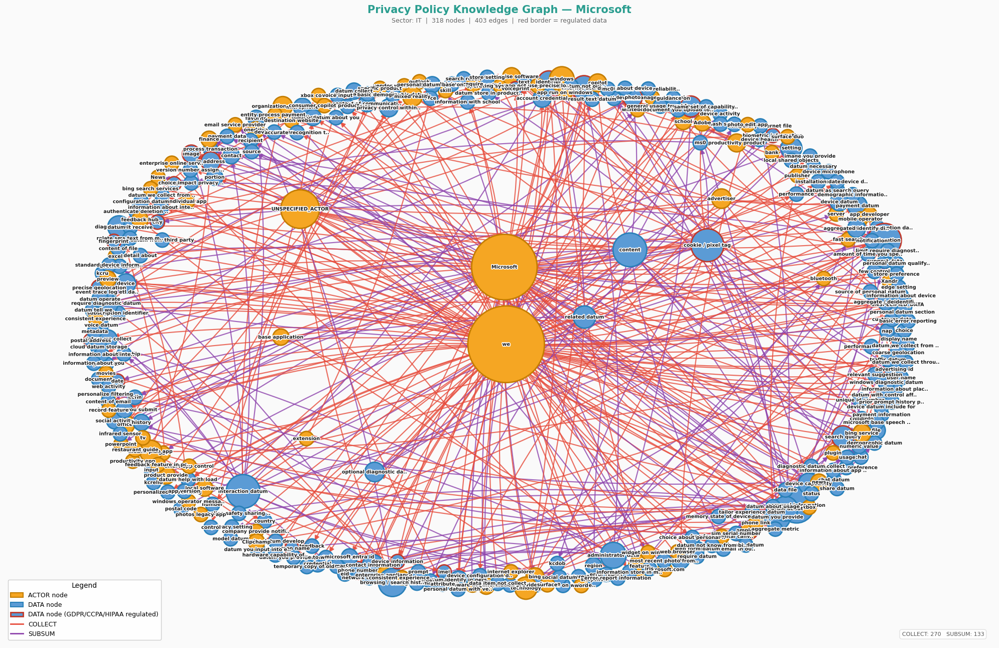

  Saved: demo_kg_Microsoft.png

  Regulated DATA nodes (22):
    advertising id                           GDPR
    biometric information                    GDPR + CCPA + HIPAA
    city                                     HIPAA
    cookie / pixel tag                       GDPR
    cookies                                  GDPR
    date                                     HIPAA
    device information                       HIPAA
    email address                            CCPA + HIPAA
    fingerprint                              GDPR + CCPA + HIPAA
    geolocation                              GDPR + CCPA
    identifier                               HIPAA
    image                                    HIPAA
    imei                                     HIPAA
    internet activity                        CCPA
    ip address                               GDPR + CCPA + HIPAA
    person name                              GDPR + CCPA + HIPAA
    phone number                             CCPA + HIPAA


In [190]:
def plot_company_kg_demo(graphml_dir, company_name="Microsoft"):
    """
    Plot the privacy-policy KG for one company.
    Change company_name to any key in SECTOR_MAP.
    """
    fp = os.path.join(graphml_dir, f"{company_name}.graphml.xml")
    if not os.path.exists(fp): fp = os.path.join(graphml_dir, f"{company_name}.graphml")
    if not os.path.exists(fp):
        print(f"File not found for '{company_name}'. Check name matches SECTOR_MAP."); return

    sector  = SECTOR_MAP.get(company_name, "Unknown")
    s_col   = SECTOR_PALETTE.get(sector, "#aaa")
    G       = nx.read_graphml(fp)
    print(f"  Company : {company_name.replace('_',' ')}")
    print(f"  Sector  : {sector}")
    print(f"  Nodes   : {G.number_of_nodes()}")
    print(f"  Edges   : {G.number_of_edges()}")

    n_colors, n_borders, n_sizes = [], [], []
    for n, d in G.nodes(data=True):
        ntype     = d.get("type","DATA")
        regulated = n.lower().strip() in SENSITIVE_TYPES
        n_colors.append("#F5A623" if ntype=="ACTOR" else "#5B9BD5")
        n_borders.append("#C0392B" if regulated else ("#C47D00" if ntype=="ACTOR" else "#2980B9"))
        n_sizes.append(max(420, 300 + G.degree(n)*120))

    rel_pal   = {"COLLECT":"#E74C3C","SUBSUM":"#8E44AD","SHARE":"#27AE60","USE":"#2980B9"}
    e_colors  = [rel_pal.get(d.get("relationship","").upper(),"#999") for _,_,d in G.edges(data=True)]
    e_labels  = {(u,v): d.get("relationship","") for u,v,d in G.edges(data=True) if d.get("relationship","")}
    pos       = (nx.kamada_kawai_layout(G) if G.number_of_nodes() <= 30
                 else nx.spring_layout(G, seed=42, k=2.2, iterations=80))

    fig, ax = plt.subplots(figsize=(20, 13))
    fig.patch.set_facecolor("#FAFAFA"); ax.set_facecolor("#FAFAFA")
    nx.draw_networkx_nodes(G, pos, ax=ax, node_color=n_colors,
                           node_size=n_sizes, linewidths=2, edgecolors=n_borders)
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color=e_colors, width=1.6,
                           arrows=True, arrowsize=14,
                           connectionstyle="arc3,rad=0.07", alpha=0.8)
    for node, (x, y) in pos.items():
        lbl = node if len(node) <= 24 else node[:22]+".."
        ax.text(x, y, lbl, fontsize=7, ha="center", va="center", fontweight="bold",
                color="#1a1a1a",
                path_effects=[pe.withStroke(linewidth=2.5, foreground="white")])
    if G.number_of_edges() <= 60:
        nx.draw_networkx_edge_labels(G, pos, edge_labels=e_labels, ax=ax, font_size=6,
                                     font_color="#444",
                                     bbox=dict(boxstyle="round,pad=0.12",
                                               fc="white", alpha=0.7, ec="none"))
    ax.legend(handles=[
        mpatches.Patch(color="#F5A623", ec="#C47D00", lw=1.5, label="ACTOR node"),
        mpatches.Patch(color="#5B9BD5", ec="#2980B9", lw=1.5, label="DATA node"),
        mpatches.Patch(color="#5B9BD5", ec="#C0392B", lw=2,   label="DATA node (GDPR/CCPA/HIPAA regulated)"),
        Line2D([0],[0], color="#E74C3C", lw=2, label="COLLECT"),
        Line2D([0],[0], color="#8E44AD", lw=2, label="SUBSUM"),
        #Line2D([0],[0], color="#27AE60", lw=2, label="SHARE"),
        #Line2D([0],[0], color="#2980B9", lw=2, label="USE"),
    ], loc="lower left", framealpha=0.95, edgecolor="#ccc", fontsize=9,
       title="Legend", title_fontsize=10)
    rel_counts = Counter(d.get("relationship","?") for _,_,d in G.edges(data=True))
    ax.text(0.99, 0.01, "   ".join(f"{r}: {c}" for r,c in rel_counts.most_common()),
            transform=ax.transAxes, ha="right", va="bottom", fontsize=8, color="#555",
            bbox=dict(boxstyle="round,pad=0.4", fc="white", alpha=0.85, ec="#ddd"))
    ax.set_title(f"Privacy Policy Knowledge Graph — {company_name.replace('_',' ')}",
                 fontsize=15, fontweight="bold", pad=14, color=s_col)
    ax.annotate(f"Sector: {sector}  |  {G.number_of_nodes()} nodes  |  "
                f"{G.number_of_edges()} edges  |  red border = regulated data",
                xy=(0.5,1.00), xycoords="axes fraction", ha="center", fontsize=9, color="#666")
    ax.axis("off"); plt.tight_layout()
    out = f"demo_kg_{company_name}.png"
    plt.savefig(out, dpi=160, bbox_inches="tight", facecolor="#FAFAFA")
    plt.show(); print(f"  Saved: {out}")

    reg_nodes = [(n,d) for n,d in G.nodes(data=True)
                 if d.get("type","")=="DATA" and n.lower().strip() in SENSITIVE_TYPES]
    if reg_nodes:
        print(f"\n  Regulated DATA nodes ({len(reg_nodes)}):")
        for n, _ in sorted(reg_nodes):
            nl   = n.lower().strip()
            tags = [t for t,v in [("GDPR",GDPR_TYPES),("CCPA",CCPA_TYPES),("HIPAA",HIPAA_TYPES)] if nl in v]
            print(f"    {n:<40} {' + '.join(tags)}")
    print(f"\n  Relationship breakdown:")
    for rel, cnt in rel_counts.most_common(): print(f"    {rel:<14} {cnt}")


# ── Run demo ──────────────────────────────────────────────────────────────────
plot_company_kg_demo(GRAPHML_DIR, company_name="Microsoft")

---
## Part 12 — Company Explorer

**Step 1:** Run the cell below to see all 184 companies grouped by sector with index numbers.  
**Step 2:** Set `COMPANY_INDEX` to any number and re-run the plot cell.

A compliance summary is printed after the graph showing every regulated DATA node and which regulations apply — useful for quick per-company compliance screening.

In [191]:
def list_all_companies(graphml_dir):
    """Print all 184 companies grouped by sector with index numbers."""
    files = sorted(glob.glob(os.path.join(graphml_dir, "*.graphml.xml")))
    if not files: files = sorted(glob.glob(os.path.join(graphml_dir, "*.graphml")))
    by_sector = defaultdict(list)
    for idx, fp in enumerate(files):
        name = os.path.basename(fp).replace(".graphml.xml","").replace(".graphml","")
        by_sector[SECTOR_MAP.get(name,"Unknown")].append((idx, name))
    print(f"{'='*66}"); print(f"  Total companies: {len(files)}"); print(f"{'='*66}")
    for sector in ["Healthcare","Financial","IT","Unknown"]:
        if sector not in by_sector: continue
        entries = sorted(by_sector[sector], key=lambda x:x[1])
        print(f"\n  {'─'*62}"); print(f"  {sector.upper()}  ({len(entries)} companies)"); print(f"  {'─'*62}")
        for i in range(0, len(entries), 2):
            left  = entries[i]
            right = entries[i+1] if i+1 < len(entries) else None
            print(f"  [{left[0]:>3}]  {left[1]:<40}  "
                  f"{('['+str(right[0])+']  '+right[1]) if right else ''}")
    print(f"\n{'='*66}"); print("  Set COMPANY_INDEX in the cell below."); print(f"{'='*66}")
    return files


ALL_FILES = list_all_companies(GRAPHML_DIR)

  Total companies: 184

  ──────────────────────────────────────────────────────────────
  HEALTHCARE  (56 companies)
  ──────────────────────────────────────────────────────────────
  [  0]  AbbVie                                    [1]  Abbott_Laboratories
  [  7]  Agilent_Technologies                      [9]  Align_Technology
  [ 13]  Amgen                                     [27]  Baxter_International
  [ 28]  Becton_Dickinson                          [30]  Bio-Techne
  [ 31]  Biogen                                    [34]  Boston_Scientific
  [ 35]  Bristol_Myers_Squibb                      [40]  CVS_Health
  [ 43]  Cardinal_Health                           [45]  Cencora
  [ 46]  Centene_Corporation                       [47]  Charles_River_Laboratories
  [ 50]  Cigna                                     [57]  Cooper_Companies_(The)
  [ 61]  DaVita                                    [62]  Danaher_Corporation
  [ 64]  Dexcom                                    [66]  Edwards_Lifescie

  Company : CVS Health
  Sector  : Healthcare
  Nodes   : 26
  Edges   : 25


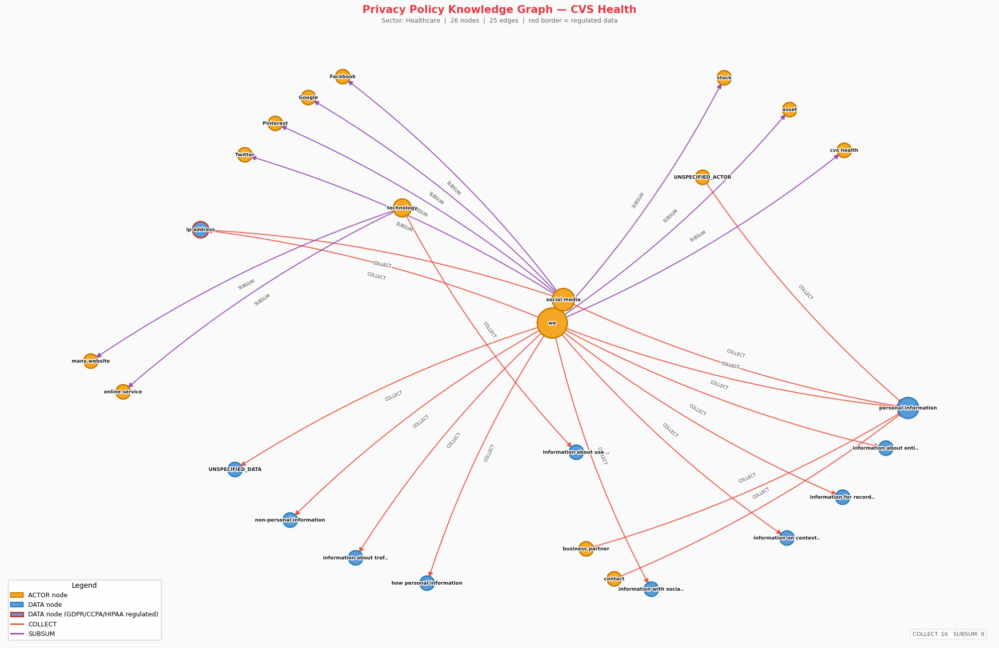

  Saved: demo_kg_CVS_Health.png

  Regulated DATA nodes (1):
    ip address                               GDPR + CCPA + HIPAA

  Relationship breakdown:
    COLLECT        16
    SUBSUM         9


In [192]:
# ╔══════════════════════════════════════════════╗
# ║  Change this number to explore any company  ║
COMPANY_INDEX = 40                              #
# ╚══════════════════════════════════════════════╝

def plot_company_kg(files, index):
    if index < 0 or index >= len(files):
        print(f"Index {index} out of range (0–{len(files)-1})."); return
    name = os.path.basename(files[index]).replace(".graphml.xml","").replace(".graphml","")
    plot_company_kg_demo(GRAPHML_DIR, company_name=name)


plot_company_kg(ALL_FILES, COMPANY_INDEX)

---
## Part 13 — Node-Focus: Sector Differences Highlighted

Shows all DATA nodes one hop from a chosen anchor node (e.g. `"personal information*"`), coloured by which sector(s) they appear in. Useful for identifying which data types are universal vs sector-specific.

### How to read the graph
| Element | Meaning |
|---------|---------|
| 🔴Red node | Anchor / focus node |
| 🔴Red node | Healthcare only |
| 🟢Green node | Financial only |
| 🔵Blue node | IT only |
| 🟣Purple node | Shared across 2+ sectors |
| Node size | Total company frequency — larger = more companies |
| Edge width | Accumulated company count for that connection |

### Parameters you can change
| Parameter | Default | Effect |
|-----------|---------|--------|
| `focus_node` | `"personal information*"` | Glob pattern for anchor node |
| `min_companies` | `2` | Minimum companies for a neighbour to appear |
| `k` | `2.8` | Node spacing — raise if graph is crowded |


In [193]:
def run_node_focus(
    graphml_dir,
    focus_node       = "personal information*",
    target_node_type = "DATA",
    min_companies    = 2,
    k                = 3.0,
    figsize          = (15, 12),
):
    """
    Node-Focus ego-graph with sector differences highlighted.

    Shows all nodes one hop from `focus_node`, coloured by which
    sector(s) they appear in. Prints a shared/unique summary table.

    Parameters
    ----------
    graphml_dir      : path to folder containing .graphml.xml files
    focus_node       : glob pattern to match the anchor node label
    target_node_type : only follow neighbours of this type ("DATA" or "ACTOR")
    min_companies    : minimum companies a neighbour must appear in to be shown
    k                : spring layout spacing (raise if nodes overlap)
    figsize          : (width, height) of the output figure
    """
    SECTOR_COLORS = {
        "Healthcare": "#E74C3C",   # red
        "Financial":  "#2ECC71",   # green
        "IT":         "#3498DB",   # blue
        "shared":     "#9B59B6",   # purple — appears in 2+ sectors
    }

    # ── 1. Scan all files ─────────────────────────────────────────────────────
    all_files = sorted(
        f for f in os.listdir(graphml_dir)
        if f.endswith(".xml") or f.endswith(".graphml")
    )
    print(f"Scanning {len(all_files)} files for '{focus_node}'...\n")

    sector_nodes  = defaultdict(Counter)
    sector_edges  = defaultdict(Counter)
    sector_counts = defaultdict(int)

    for filename in all_files:
        company = filename.replace(".graphml.xml", "").replace(".graphml", "")
        sector  = SECTOR_MAP.get(company)
        if sector not in SECTORS:
            continue
        try:
            G = nx.read_graphml(os.path.join(graphml_dir, filename))
            matches = [n for n in G.nodes()
                       if fnmatch.fnmatch(n.lower(), focus_node.lower())]
            if not matches:
                continue
            sector_counts[sector] += 1
            seen_n, seen_e = set(), set()
            for focus in matches:
                for neighbor in G.neighbors(focus):
                    if G.nodes[neighbor].get("type", "DATA") != target_node_type:
                        continue
                    if neighbor not in seen_n:
                        sector_nodes[sector][neighbor] += 1
                        seen_n.add(neighbor)
                    rel = G[focus][neighbor].get("relationship", "")
                    key = (focus, rel, neighbor)
                    if key not in seen_e:
                        sector_edges[sector][key] += 1
                        seen_e.add(key)
        except Exception as e:
            print(f"  Warning [{filename}]: {e}")

    # ── 2. Classify: unique to one sector vs shared ───────────────────────────
    all_neighbors = set()
    for s in SECTORS:
        all_neighbors.update(
            n for n, c in sector_nodes[s].items() if c >= min_companies
        )

    def which_sectors(node):
        return [s for s in SECTORS
                if sector_nodes[s].get(node, 0) >= min_companies]

    node_sector_map = {n: which_sectors(n) for n in all_neighbors}
    unique_to    = {s: set() for s in SECTORS}
    shared_nodes = set()
    for node, secs in node_sector_map.items():
        if len(secs) == 1:  unique_to[secs[0]].add(node)
        else:               shared_nodes.add(node)

    print(f"  Shared across sectors   : {len(shared_nodes)}")
    for s in SECTORS:
        print(f"  Unique to {s:<12} : {len(unique_to[s])}  "
              f"({sector_counts[s]} companies with focus node)")

    if not all_neighbors:
        print("\n  No nodes found — try lowering min_companies or broadening focus_node.")
        return

    # ── 3. Build combined graph ───────────────────────────────────────────────
    G_all = nx.DiGraph()
    G_all.add_node(focus_node, type="FOCUS")
    for node in all_neighbors:
        G_all.add_node(node,
                       type=target_node_type,
                       sectors=node_sector_map[node],
                       total_count=sum(sector_nodes[s].get(node, 0)
                                       for s in SECTORS))
    edge_agg, edge_rel = defaultdict(int), {}
    for s in SECTORS:
        for (focus, rel, neighbor), count in sector_edges[s].items():
            if neighbor in all_neighbors:
                edge_agg[(focus_node, neighbor)] += count
                edge_rel[(focus_node, neighbor)]  = rel
    for (u, v), weight in edge_agg.items():
        G_all.add_edge(u, v, weight=weight,
                       relationship=edge_rel.get((u, v), ""))

    # ── 4. Draw ───────────────────────────────────────────────────────────────
    def node_color(n):
        if n == focus_node:   return "#FF4136"
        secs = node_sector_map.get(n, [])
        if len(secs) > 1:    return SECTOR_COLORS["shared"]
        if len(secs) == 1:   return SECTOR_COLORS[secs[0]]
        return "#CCCCCC"

    node_colors = [node_color(n) for n in G_all.nodes()]
    node_sizes  = [1500 if n == focus_node
                   else 300 + G_all.nodes[n].get("total_count", 1) * 60
                   for n in G_all.nodes()]
    edge_widths = [0.5 + G_all[u][v].get("weight", 1) * 0.3
                   for u, v in G_all.edges()]

    fig, ax = plt.subplots(figsize=figsize, constrained_layout=True)
    pos = nx.spring_layout(G_all, seed=42, k=3.0)

    nx.draw_networkx_nodes(G_all, pos, node_color=node_colors,
                           node_size=node_sizes, alpha=0.92, ax=ax)
    nx.draw_networkx_edges(G_all, pos, edge_color="#AAAAAA",
                           width=edge_widths, arrows=True, arrowsize=12,
                           connectionstyle="arc3,rad=0.08", ax=ax)
    nx.draw_networkx_labels(G_all, pos, font_size=8,
                            font_weight="bold", ax=ax)

    ax.legend(handles=[
        mpatches.Patch(color="#FF4136",                   label=f"Focus: '{focus_node}'"),
        mpatches.Patch(color=SECTOR_COLORS["Healthcare"], label="Healthcare only"),
        mpatches.Patch(color=SECTOR_COLORS["Financial"],  label="Financial only"),
        mpatches.Patch(color=SECTOR_COLORS["IT"],         label="IT only"),
        mpatches.Patch(color=SECTOR_COLORS["shared"],     label="Shared across sectors"),
    ], loc="lower left", fontsize=12, framealpha=0.9)
    ax.set_title(
        f"'{focus_node}' → {target_node_type} nodes\n"
        f"Colour = sector uniqueness  ·  Size = company frequency  ·  "
        f"min {min_companies} companies",
        fontsize=13, fontweight="bold"
    )
    ax.axis("off")
    out = f"node_focus_{focus_node.replace('*','').replace(' ','_')}.png"
    plt.savefig(out, dpi=160, bbox_inches="tight", facecolor="white")
    plt.show()
    print(f"  Saved: {out}")

    # ── 5. Printed summary ────────────────────────────────────────────────────
    print(f"\n  Shared nodes (in 2+ sectors)")
    print(f"  {'Node':<35} " + "  ".join(f"{s:<12}" for s in SECTORS))
    print("  " + "─" * 70)
    for n in sorted(shared_nodes,
                    key=lambda n: sum(sector_nodes[s].get(n, 0) for s in SECTORS),
                    reverse=True):
        counts = "  ".join(f"{sector_nodes[s].get(n, 0):<12}" for s in SECTORS)
        print(f"  {n:<35} {counts}")

    print(f"\n  Unique nodes per sector")
    for s in SECTORS:
        print(f"\n  {s} only:")
        for n in sorted(unique_to[s],
                        key=lambda n: sector_nodes[s].get(n, 0),
                        reverse=True):
            print(f"    {n:<35} {sector_nodes[s][n]} companies")


print("run_node_focus() defined.")


run_node_focus() defined.


---
## Part 14 — `main()` — Full End-to-End Pipeline

Running `main()` executes all steps in order and saves all outputs.
This is the single entry point to reproduce every result in the notebook.

### Steps & Outputs
| Step | Function | Output |
|------|----------|--------|
| 0 | `plot_company_kg_demo()` | `demo_kg_IBM.png` |
| 1 | `load_all_files()` | `eda_metrics.csv` |
| 2 | `build_knowledge_graph()` | `privacy_kg.graphml` |
| 3 | `rq2_within_sector_structure()` | Printed tables |
| 4 | `plot_rq2_bar_chart()` | `rq2_within_sector_bars.png` |
| 4b | `run_sector_graphs()` | `*_sector_kg.png` · `RQ2_*_4panel_deepdive.png` |
| 5 | `rq1_cross_sector()` | `violation_summary.csv` |
| 6 | `run_graph_algorithm_demos()` | Printed traversal results |
| 7 | `compute_centrality()` + `plot_centrality()` | `centrality_charts.png` · `centrality_metrics.csv` |
| 8 | `plot_rq1_cross_sector_network()` | `rq1_cross_sector_network.png` |
| 8b | `plot_node_focus()` | `node_focus_map.png` |
| 8c | `run_node_focus()` | `node_focus_personal_information_.png` |
| 9 | `plot_compliance_dashboard()` | `compliance_dashboard.png` |

### Return value
Returns a dict with all intermediate results for further analysis.


  Privacy Policy KG Analysis — GDPR · CCPA · HIPAA
  Healthcare (56) · IT (66) · Financial (62) = 184 companies

[0/9] Single-Company Demo — IBM
  Company : IBM
  Sector  : IT
  Nodes   : 66
  Edges   : 72


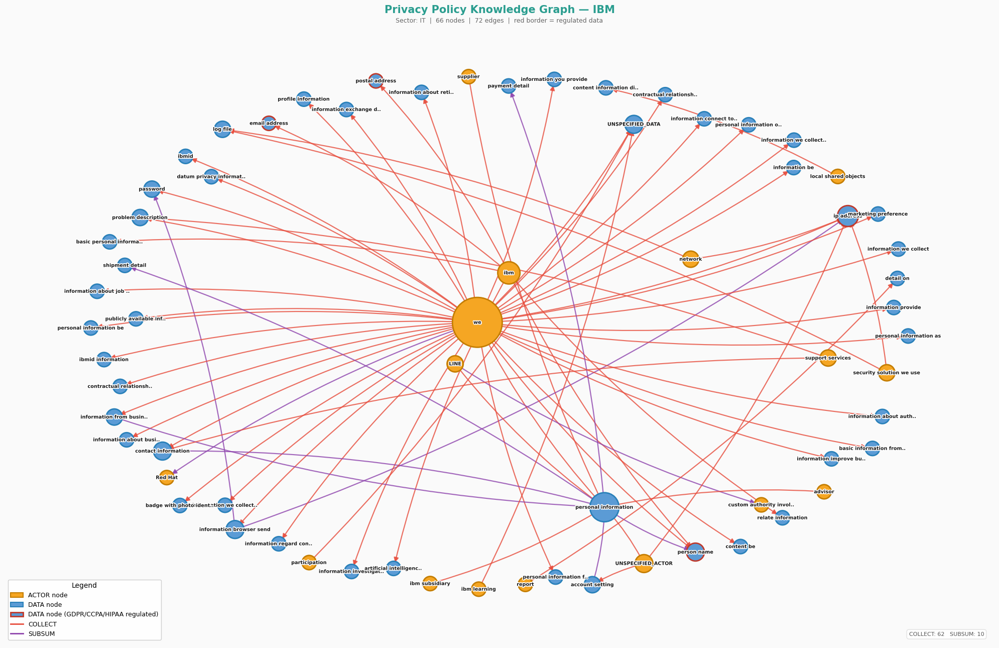

  Saved: demo_kg_IBM.png

  Regulated DATA nodes (4):
    email address                            CCPA + HIPAA
    ip address                               GDPR + CCPA + HIPAA
    person name                              GDPR + CCPA + HIPAA
    postal address                           GDPR + CCPA + HIPAA

  Relationship breakdown:
    COLLECT        62
    SUBSUM         10

[1/9] Data Loading & EDA
Loading 184 GraphML files...

Loaded 184 companies.

Per-Sector EDA Averages:
            total_nodes  total_edges  data_nodes  actor_nodes  density  avg_degree
sector                                                                            
Financial         42.00        49.94       31.89        10.11     0.04        2.15
Healthcare        36.57        41.29       26.64         9.93     0.05        2.06
IT                43.91        49.80       33.08        10.83     0.05        2.11
  Saved eda_metrics.csv

[2/9] Building Knowledge Graph
Building KG from 184 files...

Knowledge Graph 

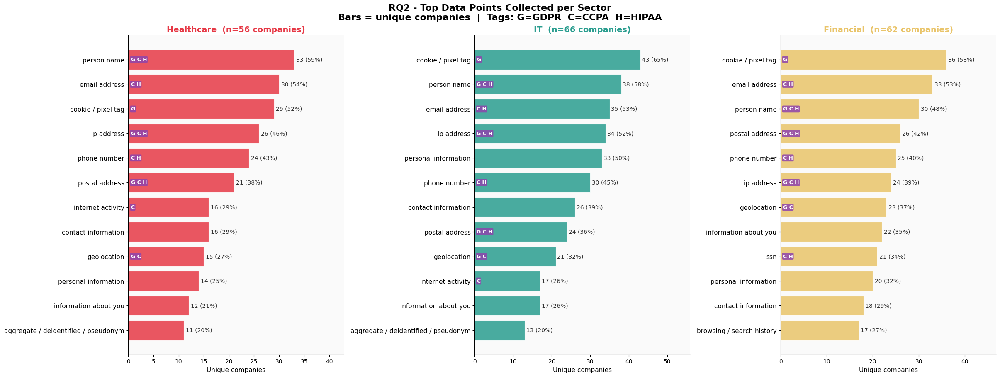

Saved rq2_within_sector_bars.png

[4b/9] Sector Knowledge Graphs + 4-Panel Deep Dives
Part 6b - Sector Knowledge Graphs & Deep Dives

  ────────────────────────────────────────────────────────────
  HEALTHCARE
  ────────────────────────────────────────────────────────────
  Healthcare    : 56 companies → 111 nodes, 105 edges


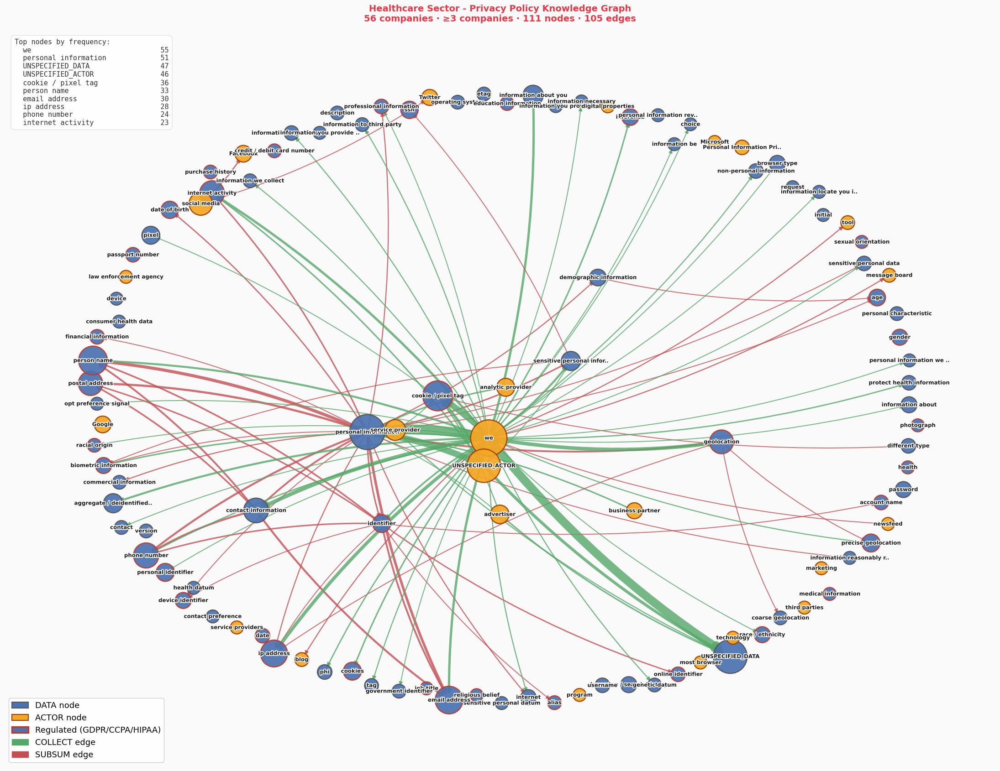

  Saved: healthcare_sector_kg.png


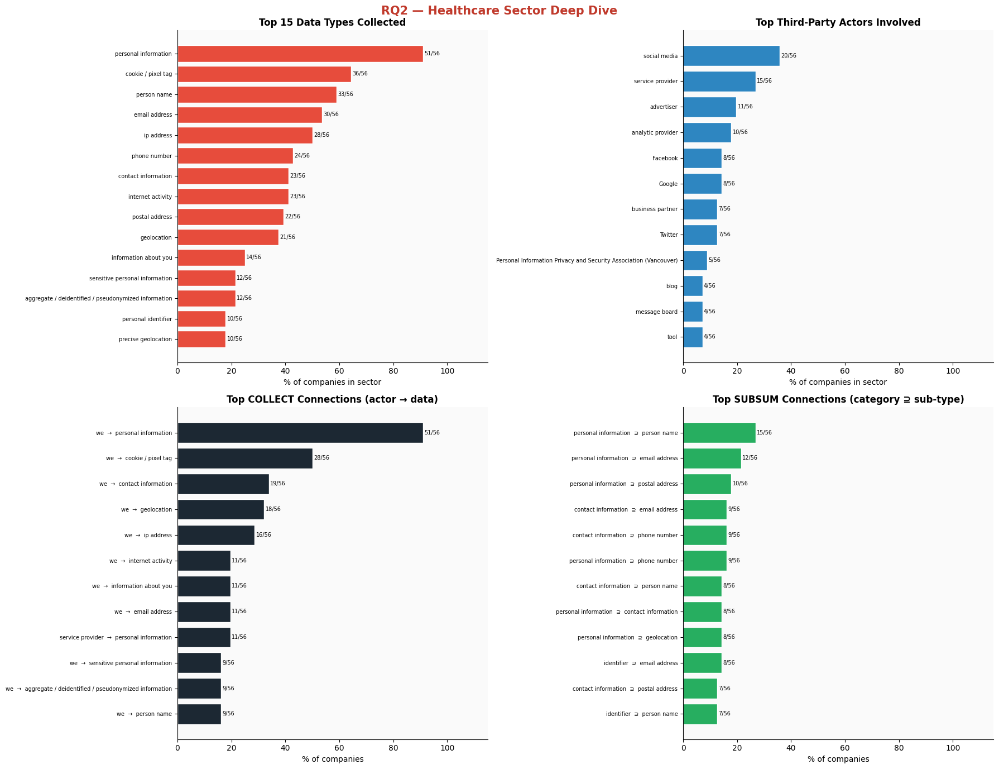

  Saved RQ2_Healthcare_4panel_deepdive.png

  Healthcare Key Findings
  Top data collected : personal information (51/56), cookie / pixel tag (36/56), person name (33/56), email address (30/56), ip address (28/56)
  Top third parties  : social media (20/56), service provider (15/56), advertiser (11/56), analytic provider (10/56)

  ────────────────────────────────────────────────────────────
  IT
  ────────────────────────────────────────────────────────────
  IT            : 66 companies → 125 nodes, 110 edges


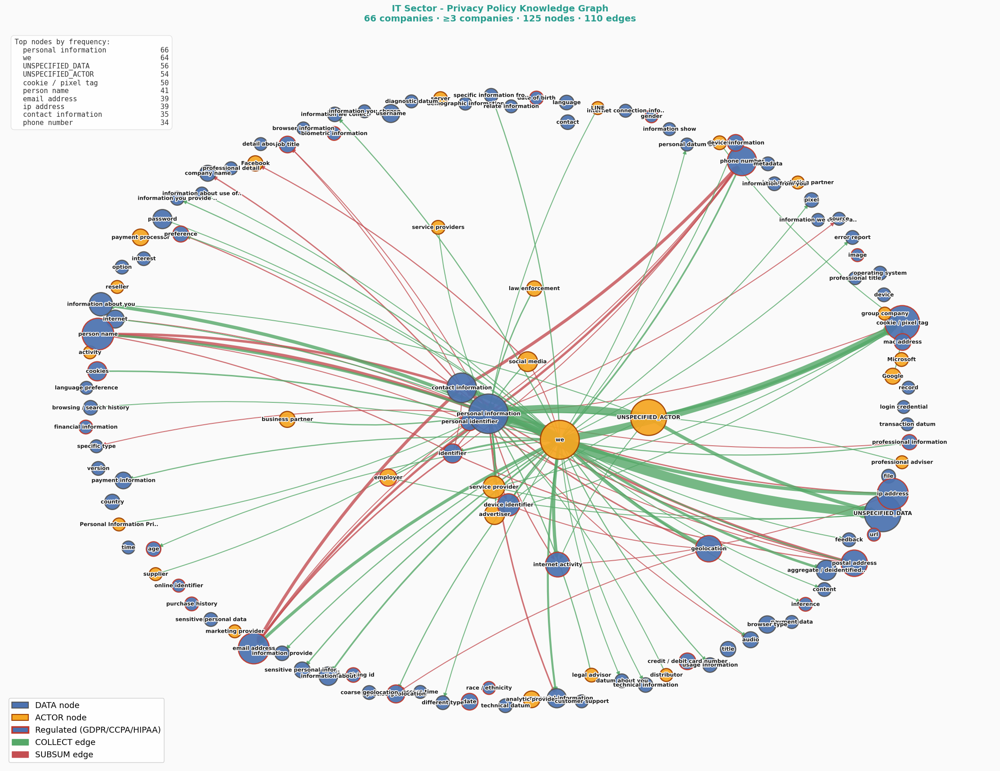

  Saved: it_sector_kg.png


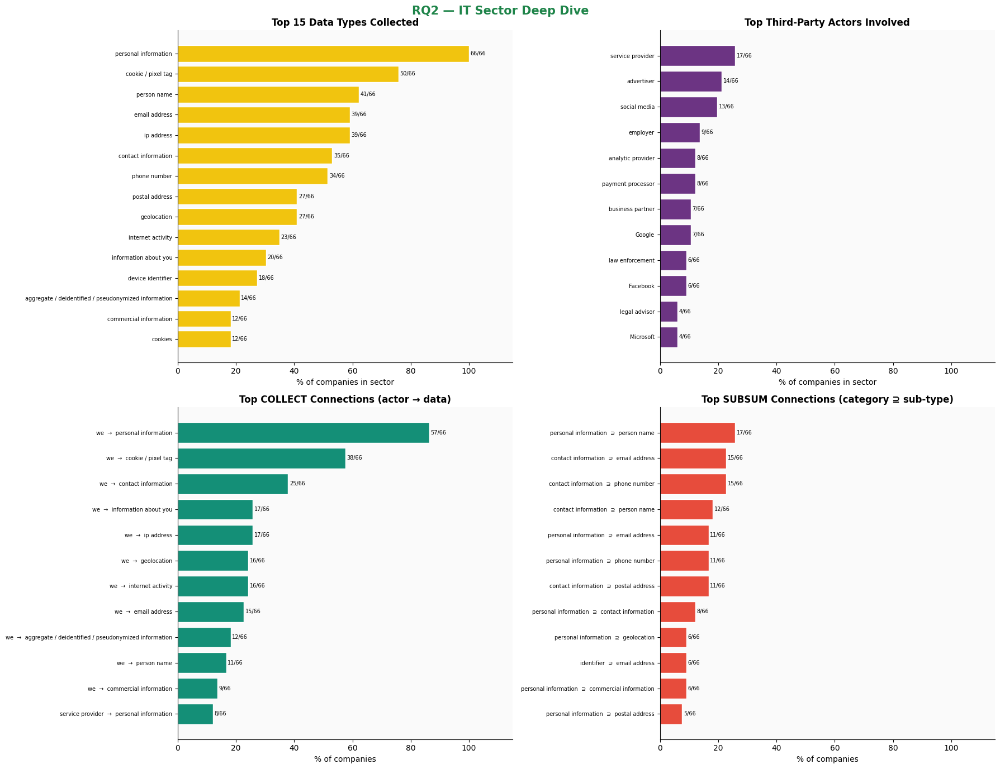

  Saved RQ2_IT_4panel_deepdive.png

  IT Key Findings
  Top data collected : personal information (66/66), cookie / pixel tag (50/66), person name (41/66), email address (39/66), ip address (39/66)
  Top third parties  : service provider (17/66), advertiser (14/66), social media (13/66), employer (9/66)

  ────────────────────────────────────────────────────────────
  FINANCIAL
  ────────────────────────────────────────────────────────────
  Financial     : 62 companies → 128 nodes, 123 edges


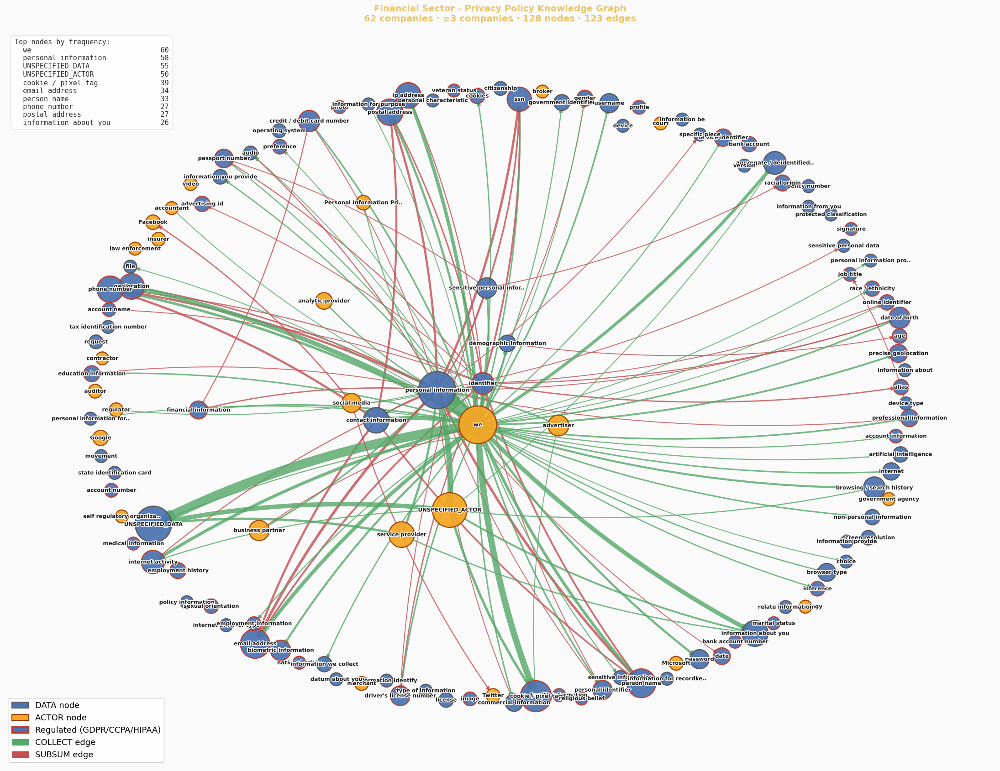

  Saved: financial_sector_kg.png


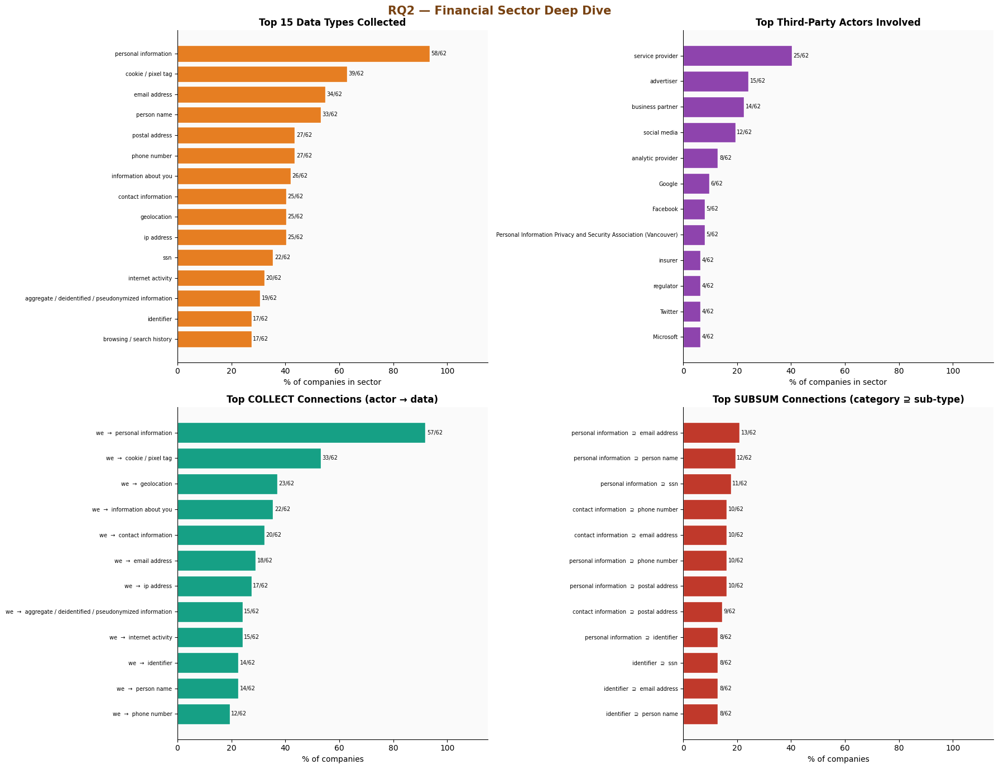

  Saved RQ2_Financial_4panel_deepdive.png

  Financial Key Findings
  Top data collected : personal information (58/62), cookie / pixel tag (39/62), email address (34/62), person name (33/62), postal address (27/62)
  Top third parties  : service provider (25/62), advertiser (15/62), business partner (14/62), social media (12/62)

[5/9] RQ1 - Cross-Sector Analysis & Compliance
RQ1 — Cross-Sector Privacy Policy Connections & Compliance

  Shared DataPoints (>= 2 sectors): 340
  DataPoint                                HC         IT         Fin         Regulations
  ----------------------------------------------------------------------------
  cookie / pixel tag                       29/56      43/66      36/62       GDPR
  person name                              33/56      38/66      30/62       GDPR + CCPA + HIPAA
  email address                            30/56      35/66      33/62       CCPA + HIPAA
  ip address                               26/56      34/66      24/62       GDPR +

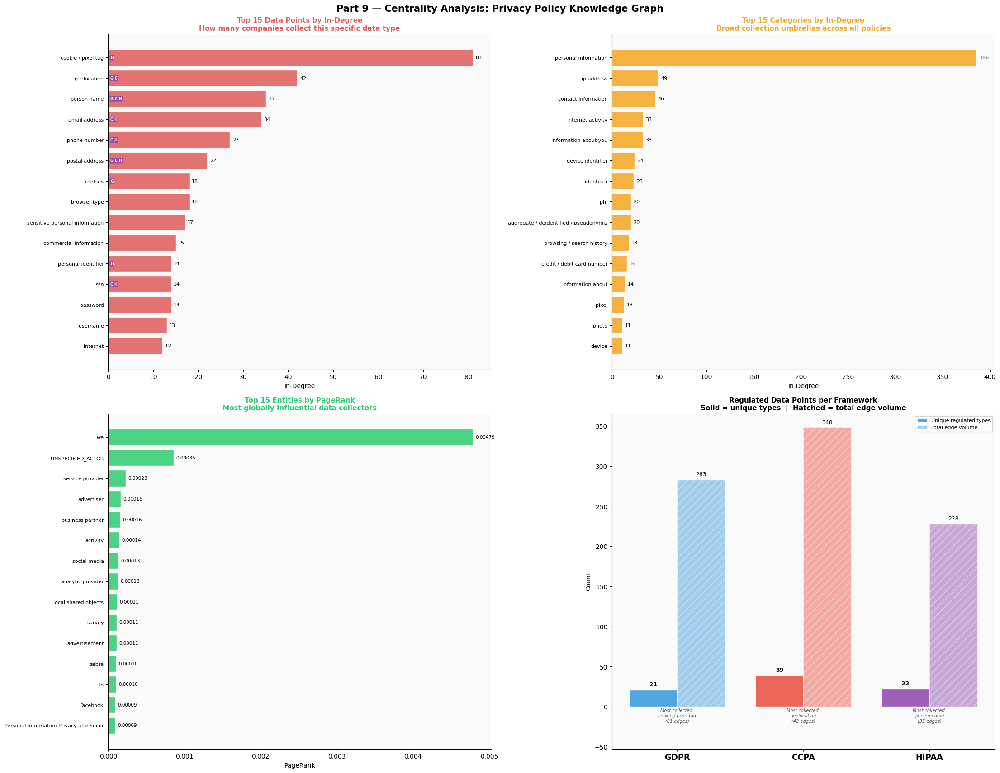

Saved centrality_charts.png

  Top 15 Data Points by In-Degree:
                        Data Point  In-Degree  PageRank
1               cookie / pixel tag         81  0.002612
2                      geolocation         42  0.001456
3                      person name         35  0.001762
4                    email address         34  0.001466
5                     phone number         27  0.001392
6                   postal address         22  0.001051
7                     browser type         18  0.001650
8                          cookies         18  0.000385
9   sensitive personal information         17  0.000741
10          commercial information         15  0.000556
11                        password         14  0.002361
12                             ssn         14  0.000535
13             personal identifier         14  0.000482
14                        username         13  0.001716
15                        internet         12  0.001928
  Saved centrality_metrics.csv

[8/9] RQ

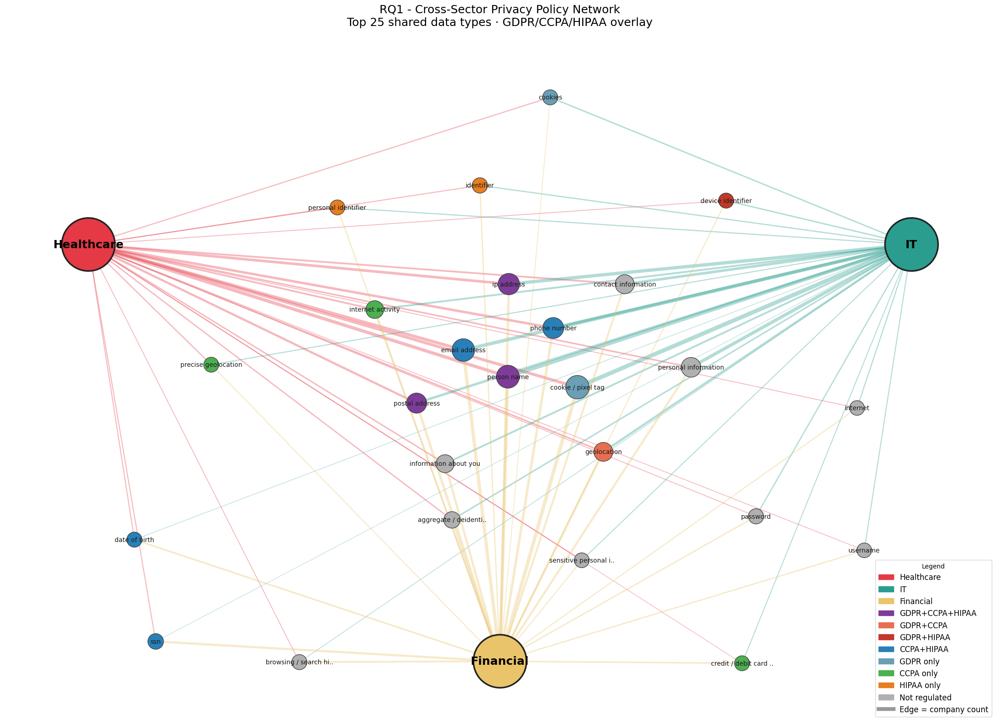

Saved rq1_cross_sector_network.png

[8b/9] Node-Focus Ego-Graph - personal information*
  Node-Focus Results: 'personal information*' → DATA nodes
  (min 2 companies)  |  151 unique data nodes found
                                                                  Data Node  Healthcare  IT  Financial  Total Companies HC % IT % Fin %      Scope         Regulations
                                                       personal information          12  30         18               60  21%  45%   29%     Shared                None
                                                                person name          15  17         14               46  27%  26%   23%     Shared GDPR + CCPA + HIPAA
                                                              email address          12  11         13               36  21%  17%   21%     Shared        CCPA + HIPAA
                                                               phone number           9  11         10               30  16%  17%   1

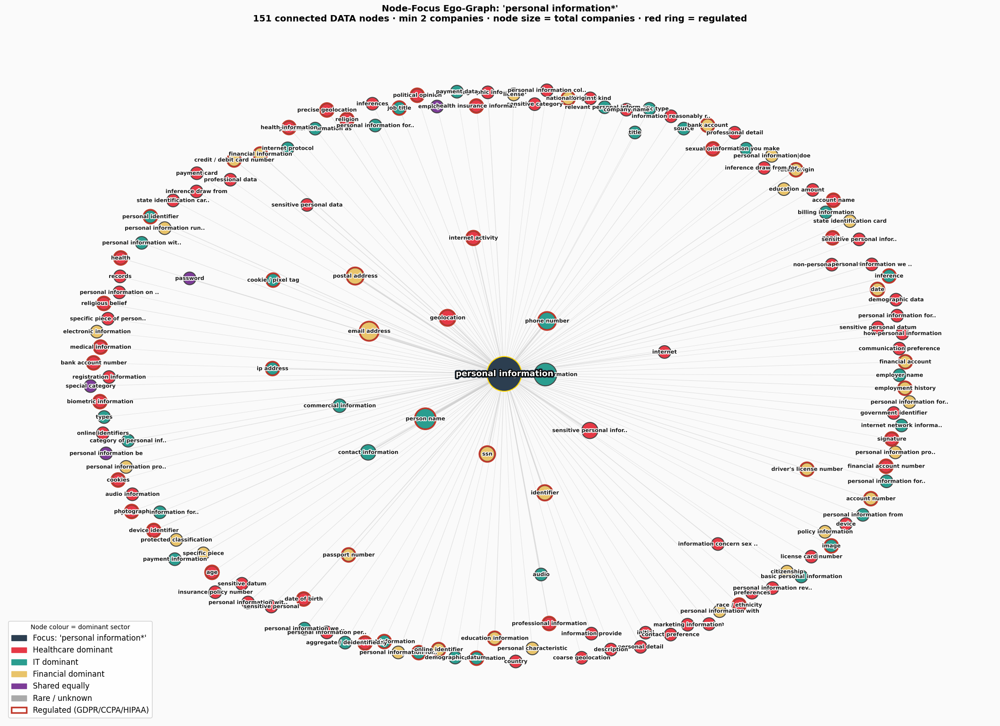

Saved node_focus_map.png

[8c/9] Node-Focus - Sector Differences (personal information*)
Scanning 184 files for 'personal information*'...

  Shared across sectors   : 32
  Unique to Healthcare   : 12  (51 companies with focus node)
  Unique to IT           : 10  (66 companies with focus node)
  Unique to Financial    : 13  (59 companies with focus node)


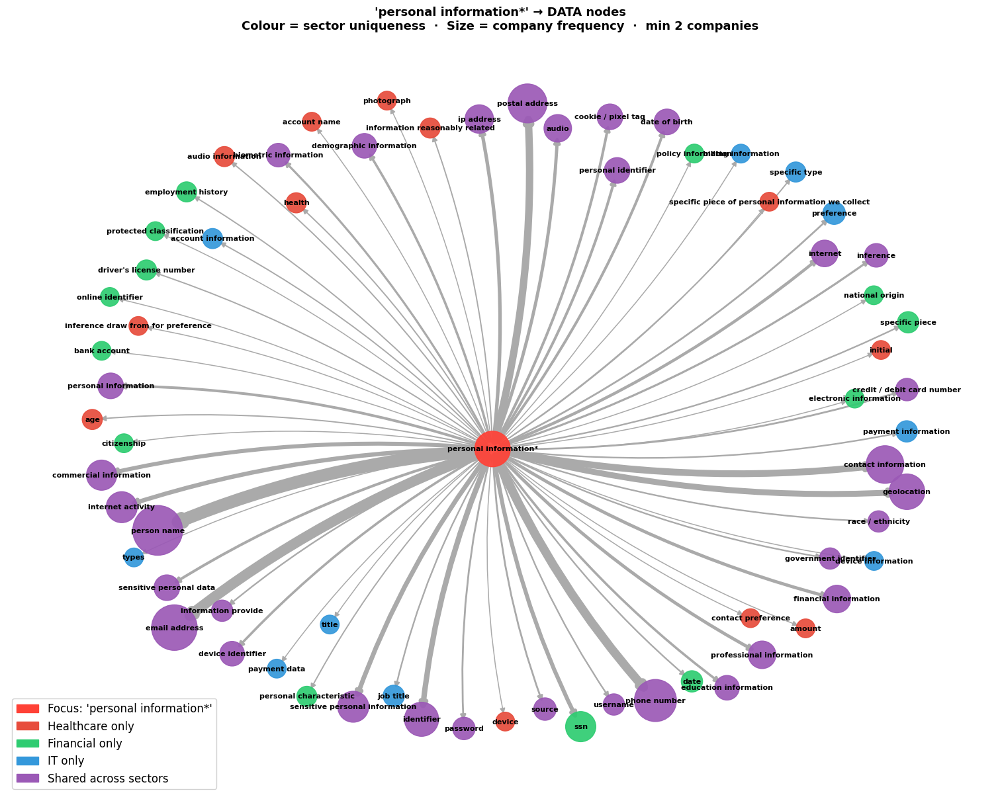

  Saved: node_focus_personal_information.png

  Shared nodes (in 2+ sectors)
  Node                                Healthcare    IT            Financial   
  ──────────────────────────────────────────────────────────────────────
  person name                         15            17            12          
  email address                       12            11            13          
  phone number                        9             11            10          
  postal address                      10            5             10          
  contact information                 8             10            5           
  geolocation                         8             6             6           
  identifier                          6             4             8           
  sensitive personal information      6             2             6           
  internet activity                   6             4             4           
  commercial information              4             6       

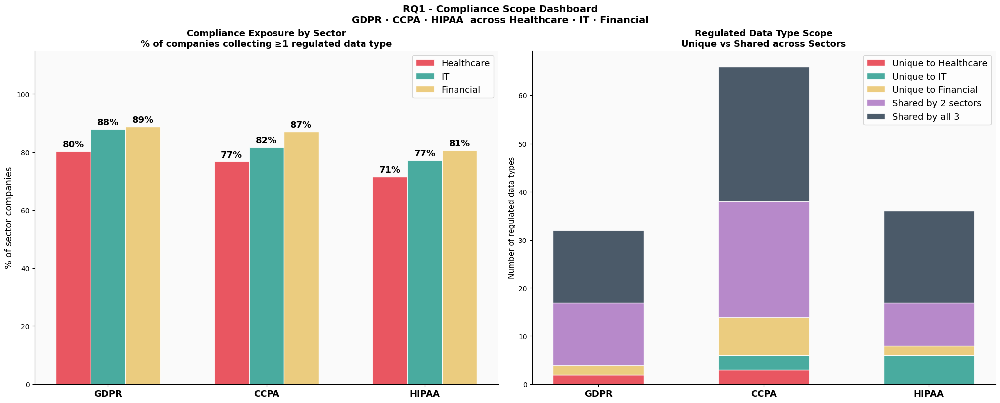

Saved compliance_dashboard.png

  Pipeline complete. Outputs saved:
    demo_kg_IBM.png
    eda_metrics.csv
    privacy_kg.graphml
    rq2_within_sector_bars.png
    healthcare_sector_kg.png
    it_sector_kg.png
    financial_sector_kg.png
    RQ2_Healthcare_4panel_deepdive.png
    RQ2_IT_4panel_deepdive.png
    RQ2_Financial_4panel_deepdive.png
    violation_summary.csv
    centrality_charts.png
    centrality_metrics.csv
    rq1_cross_sector_network.png
    node_focus_map.png
    node_focus_personal_information_.png
    compliance_dashboard.png


In [194]:
def main(graphml_dir=GRAPHML_DIR):
    """
    End-to-end Privacy Policy Knowledge Graph analysis pipeline.

    Runs all steps in order, prints all results, and saves all output files.
    Returns a dict with intermediate results for further analysis.

    Steps
    -----
    0   Single-company KG demo (IBM)
    1   Data loading & EDA
    2   Knowledge graph construction
    3   RQ2 within-sector structure table
    4   RQ2 bar chart visualization
    4b  Sector knowledge graphs + 4-panel deep dives
    5   RQ1 cross-sector analysis & compliance
    6   Graph algorithm demonstrations
    7   Centrality metrics & visualization
    8   RQ1 cross-sector network visualization
    8b  Node-focus ego-graph (quadruple-based)
    8c  Node-focus with sector differences (GraphML-based)
    9   Compliance scope dashboard
    """
    print("="*70)
    print("  Privacy Policy KG Analysis — GDPR · CCPA · HIPAA")
    print("  Healthcare (56) · IT (66) · Financial (62) = 184 companies")
    print("="*70)

    print("\n[0/9] Single-Company Demo — IBM")
    plot_company_kg_demo(graphml_dir, company_name="IBM")

    print("\n[1/9] Data Loading & EDA")
    eda_df = load_all_files(graphml_dir)
    eda_df.to_csv("eda_metrics.csv", index=False)
    print("  Saved eda_metrics.csv")

    print("\n[2/9] Building Knowledge Graph")
    G, quadruples = build_knowledge_graph(graphml_dir)
    nx.write_graphml(G, "privacy_kg.graphml")
    print("  Saved privacy_kg.graphml")

    print("\n[3/9] RQ2 - Within-Sector Structure")
    sector_dp_counts = rq2_within_sector_structure(G, quadruples, top_n=15)

    print("\n[4/9] RQ2 - Bar Chart Visualization")
    plot_rq2_bar_chart(sector_dp_counts, top_n=12)

    print("\n[4b/9] Sector Knowledge Graphs + 4-Panel Deep Dives")
    sector_graphs = run_sector_graphs(graphml_dir, min_count=MIN_COMPANIES)

    print("\n[5/9] RQ1 - Cross-Sector Analysis & Compliance")
    dp_sector_counts = rq1_cross_sector(quadruples, min_sectors=2, top_n=30)

    print("\n[6/9] Graph Algorithm Demonstrations")
    run_graph_algorithm_demos(G)

    print("\n[7/9] Centrality Metrics")
    centrality_df = compute_centrality(G, top_n=15)
    plot_centrality(centrality_df, top_n=15)
    centrality_df.to_csv("centrality_metrics.csv", index=False)
    print("  Saved centrality_metrics.csv")

    print("\n[8/9] RQ1 - Cross-Sector Network Visualization")
    plot_rq1_cross_sector_network(quadruples, top_shared=25)

    print("\n[8b/9] Node-Focus Ego-Graph - personal information*")
    plot_node_focus(quadruples, focus_term="personal information", min_cos=2)

    print("\n[8c/9] Node-Focus - Sector Differences (personal information*)")
    run_node_focus(graphml_dir, focus_node="personal information*", min_companies=2)

    print("\n[9/9] Compliance & Violation Dashboard")
    plot_compliance_dashboard(quadruples)

    print("\n"+"="*70)
    print("  Pipeline complete. Outputs saved:")
    for f in [
        "demo_kg_IBM.png", "eda_metrics.csv", "privacy_kg.graphml",
        "rq2_within_sector_bars.png",
        "healthcare_sector_kg.png", "it_sector_kg.png", "financial_sector_kg.png",
        "RQ2_Healthcare_4panel_deepdive.png",
        "RQ2_IT_4panel_deepdive.png",
        "RQ2_Financial_4panel_deepdive.png",
        "violation_summary.csv",
        "centrality_charts.png", "centrality_metrics.csv",
        "rq1_cross_sector_network.png",
        "node_focus_map.png",
        "node_focus_personal_information_.png",
        "compliance_dashboard.png",
    ]:
        print(f"    {f}")
    print("="*70)

    return {
        "G":                G,
        "quadruples":       quadruples,
        "eda_df":           eda_df,
        "sector_dp_counts": sector_dp_counts,
        "dp_sector_counts": dp_sector_counts,
        "centrality_df":    centrality_df,
    }


# ── Run the full pipeline ─────────────────────────────────────────────────────
results = main()
